In [4]:
import pandas as pd
import numpy as np
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score


In [5]:
# Load the data
data = pd.read_csv('train.csv')
print('Train')
data.head()

Train


,date_time,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,target_carbon_monoxide,target_benzene,target_nitrogen_oxides
0,2010-03-10 18:00:00,13.1,46.0,0.7578,1387.2,1087.8,1056.0,1742.8,1293.4,2.5,12.0,167.7
1,2010-03-10 19:00:00,13.2,45.3,0.7255,1279.1,888.2,1197.5,1449.9,1010.9,2.1,9.9,98.9
2,2010-03-10 20:00:00,12.6,56.2,0.7502,1331.9,929.6,1060.2,1586.1,1117.0,2.2,9.2,127.1
3,2010-03-10 21:00:00,11.0,62.4,0.7867,1321.0,929.0,1102.9,1536.5,1263.2,2.2,9.7,177.2
4,2010-03-10 22:00:00,11.9,59.0,0.7888,1272.0,852.7,1180.9,1415.5,1132.2,1.5,6.4,121.8


In [6]:
data

,date_time,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,target_carbon_monoxide,target_benzene,target_nitrogen_oxides
0,2010-03-10 18:00:00,13.1,46.0,0.7578,1387.2,1087.8,1056.0,1742.8,1293.4,2.5,12.0,167.7
1,2010-03-10 19:00:00,13.2,45.3,0.7255,1279.1,888.2,1197.5,1449.9,1010.9,2.1,9.9,98.9
2,2010-03-10 20:00:00,12.6,56.2,0.7502,1331.9,929.6,1060.2,1586.1,1117.0,2.2,9.2,127.1
3,2010-03-10 21:00:00,11.0,62.4,0.7867,1321.0,929.0,1102.9,1536.5,1263.2,2.2,9.7,177.2
4,2010-03-10 22:00:00,11.9,59.0,0.7888,1272.0,852.7,1180.9,1415.5,1132.2,1.5,6.4,121.8
...,...,...,...,...,...,...,...,...,...,...,...,...
7106,2010-12-31 20:00:00,9.2,32.0,0.3871,1000.5,811.2,873.0,909.0,910.5,1.3,5.1,191.1
7107,2010-12-31 21:00:00,9.1,33.2,0.3766,1022.7,790.0,951.6,912.9,903.4,1.4,5.8,221.3
7108,2010-12-31 22:00:00,9.6,34.6,0.4310,1044.4,767.3,861.9,889.2,1159.1,1.6,5.2,227.4
7109,2010-12-31 23:00:00,8.0,40.7,0.4085,952.8,691.9,908.5,917.0,1206.3,1.5,4.6,199.8


In [7]:
print('Train')
data.describe()

Train


,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,target_carbon_monoxide,target_benzene,target_nitrogen_oxides
count,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000
mean,20.878034,47.561004,1.110309,1091.572100,938.064970,883.903305,1513.238349,998.335565,2.086219,10.237083,204.066784
std,7.937917,17.398731,0.398950,218.537554,281.978988,310.456355,350.180310,381.537695,1.447109,7.694426,193.927723
min,1.300000,8.900000,0.198800,620.300000,364.000000,310.600000,552.900000,242.700000,0.100000,0.100000,1.900000
25%,14.900000,33.700000,0.855900,930.250000,734.900000,681.050000,1320.350000,722.850000,1.000000,4.500000,76.450000
50%,20.700000,47.300000,1.083500,1060.500000,914.200000,827.800000,1513.100000,928.700000,1.700000,8.500000,141.000000
75%,25.800000,60.800000,1.404150,1215.800000,1124.100000,1008.850000,1720.400000,1224.700000,2.800000,14.200000,260.000000
max,46.100000,90.800000,2.231000,2088.300000,2302.600000,2567.400000,2913.800000,2594.600000,12.500000,63.700000,1472.300000


In [8]:
print('Train')
data.info()

Train
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7111 entries, 0 to 7110
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   date_time               7111 non-null   object 
 1   deg_C                   7111 non-null   float64
 2   relative_humidity       7111 non-null   float64
 3   absolute_humidity       7111 non-null   float64
 4   sensor_1                7111 non-null   float64
 5   sensor_2                7111 non-null   float64
 6   sensor_3                7111 non-null   float64
 7   sensor_4                7111 non-null   float64
 8   sensor_5                7111 non-null   float64
 9   target_carbon_monoxide  7111 non-null   float64
 10  target_benzene          7111 non-null   float64
 11  target_nitrogen_oxides  7111 non-null   float64
dtypes: float64(11), object(1)
memory usage: 666.8+ KB


In [9]:
# totoal null values in each column
print('Train')
data.isnull().sum()


Train


date_time                 0
deg_C                     0
relative_humidity         0
absolute_humidity         0
sensor_1                  0
sensor_2                  0
sensor_3                  0
sensor_4                  0
sensor_5                  0
target_carbon_monoxide    0
target_benzene            0
target_nitrogen_oxides    0
dtype: int64

In [10]:
# convert date_time column to datetime type

data['date_time'] = pd.to_datetime(data['date_time'])

In [11]:
data['hour'] = data['date_time'].dt.hour

data['day'] = data['date_time'].dt.day

data['week'] = data['date_time'].dt.dayofweek

data['month'] = data['date_time'].dt.month

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7111 entries, 0 to 7110
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   date_time               7111 non-null   datetime64[ns]
 1   deg_C                   7111 non-null   float64       
 2   relative_humidity       7111 non-null   float64       
 3   absolute_humidity       7111 non-null   float64       
 4   sensor_1                7111 non-null   float64       
 5   sensor_2                7111 non-null   float64       
 6   sensor_3                7111 non-null   float64       
 7   sensor_4                7111 non-null   float64       
 8   sensor_5                7111 non-null   float64       
 9   target_carbon_monoxide  7111 non-null   float64       
 10  target_benzene          7111 non-null   float64       
 11  target_nitrogen_oxides  7111 non-null   float64       
 12  hour                    7111 non-null   int32   

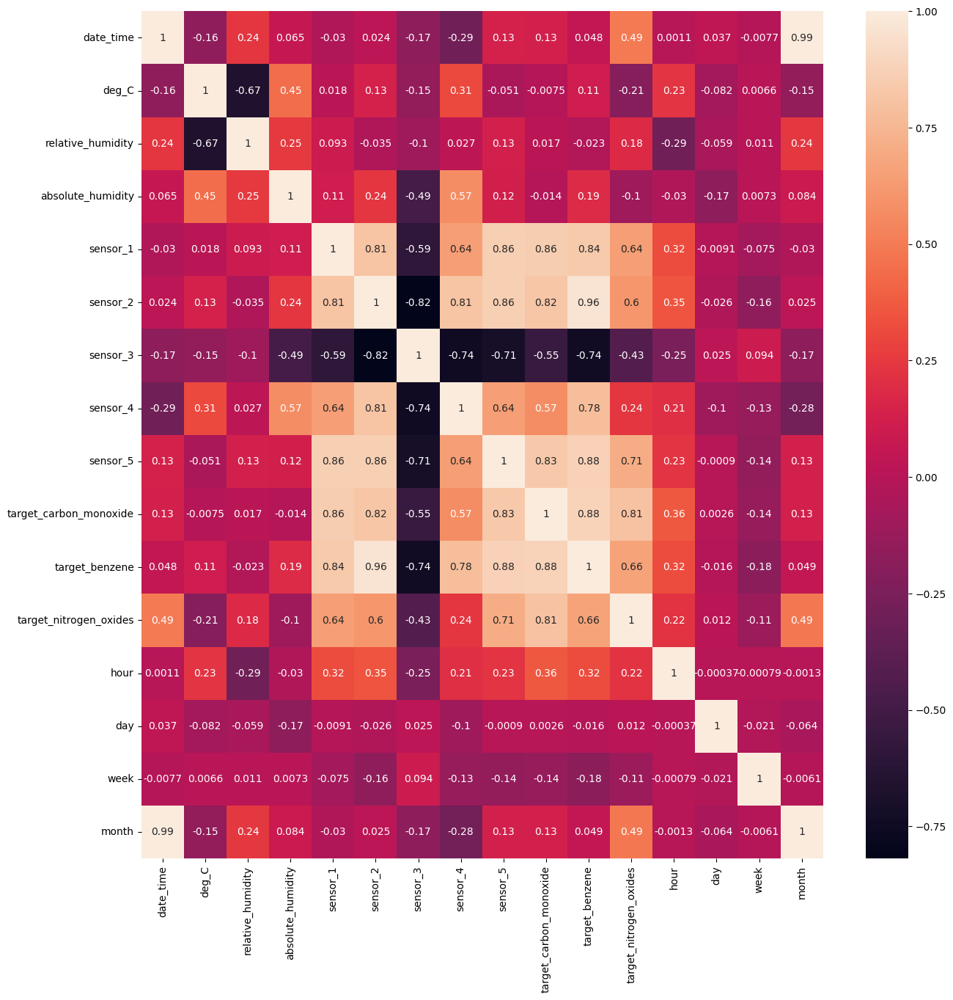

In [13]:
#plot possible correlation between features and target
import seaborn as sns
import matplotlib.pyplot as plt

#correlation matrix
corr = data.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr, annot=True)
plt.show()





C:\Users\bhask\AppData\Local\Temp\ipykernel_11468\2606422447.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['target_carbon_monoxide'], color='r')


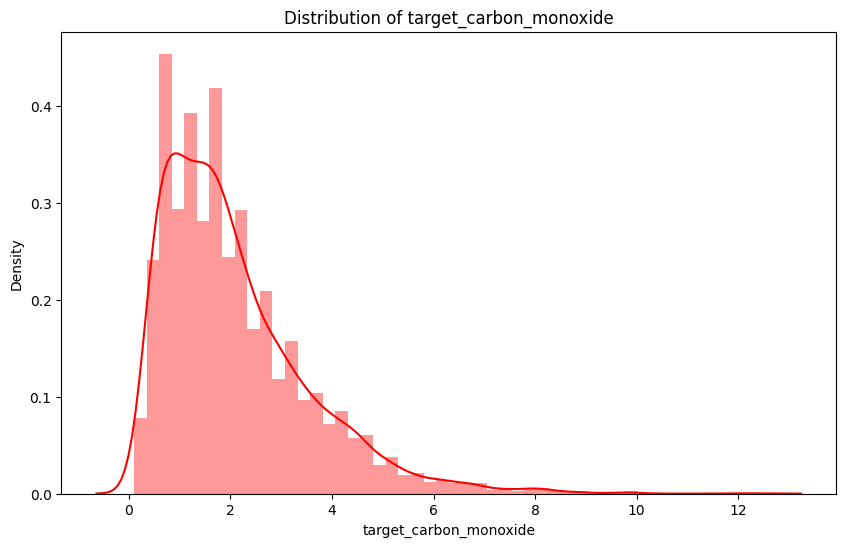

C:\Users\bhask\AppData\Local\Temp\ipykernel_11468\2606422447.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['target_benzene'], color='g')


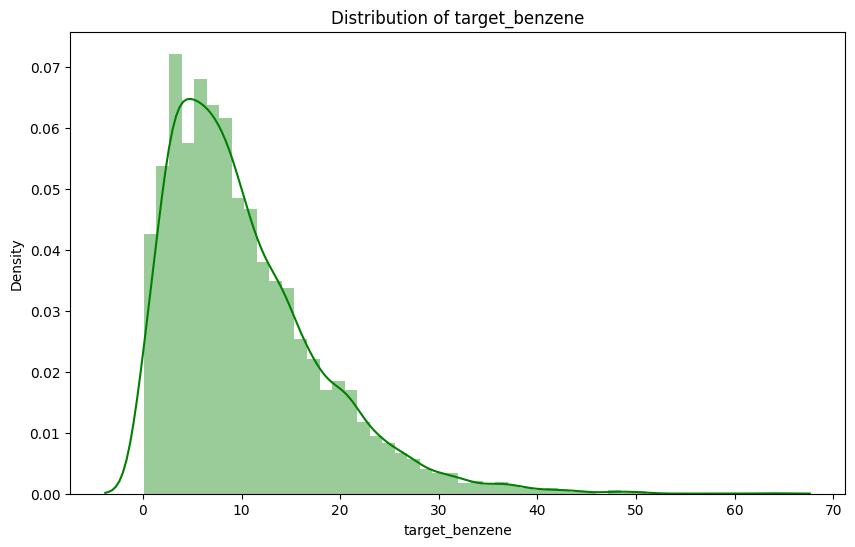

C:\Users\bhask\AppData\Local\Temp\ipykernel_11468\2606422447.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['target_nitrogen_oxides'], color='b')


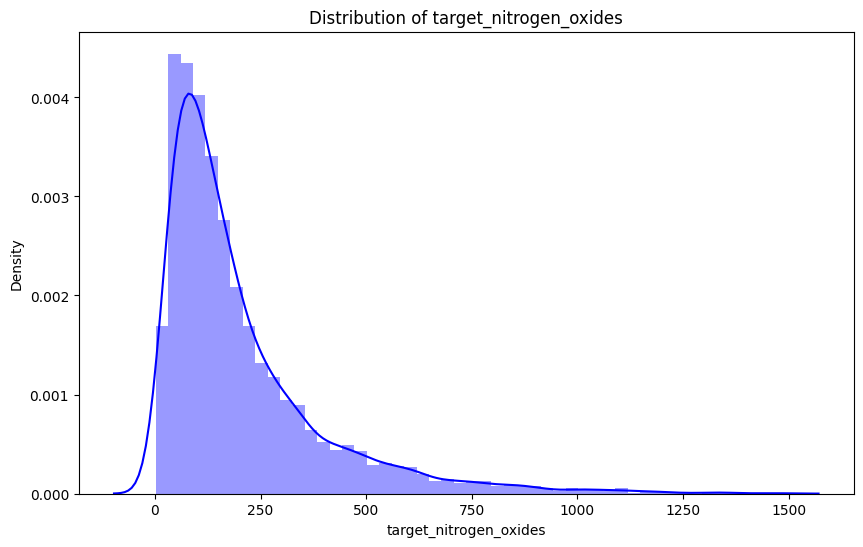

In [14]:
# plot the target variable to see the distribution
plt.figure(figsize=(10,6))
sns.distplot(data['target_carbon_monoxide'], color='r')
plt.title('Distribution of target_carbon_monoxide')
plt.show()

plt.figure(figsize=(10,6))
sns.distplot(data['target_benzene'], color='g')
plt.title('Distribution of target_benzene')
plt.show()

plt.figure(figsize=(10,6))
sns.distplot(data['target_nitrogen_oxides'], color='b')
plt.title('Distribution of target_nitrogen_oxides')

plt.show()



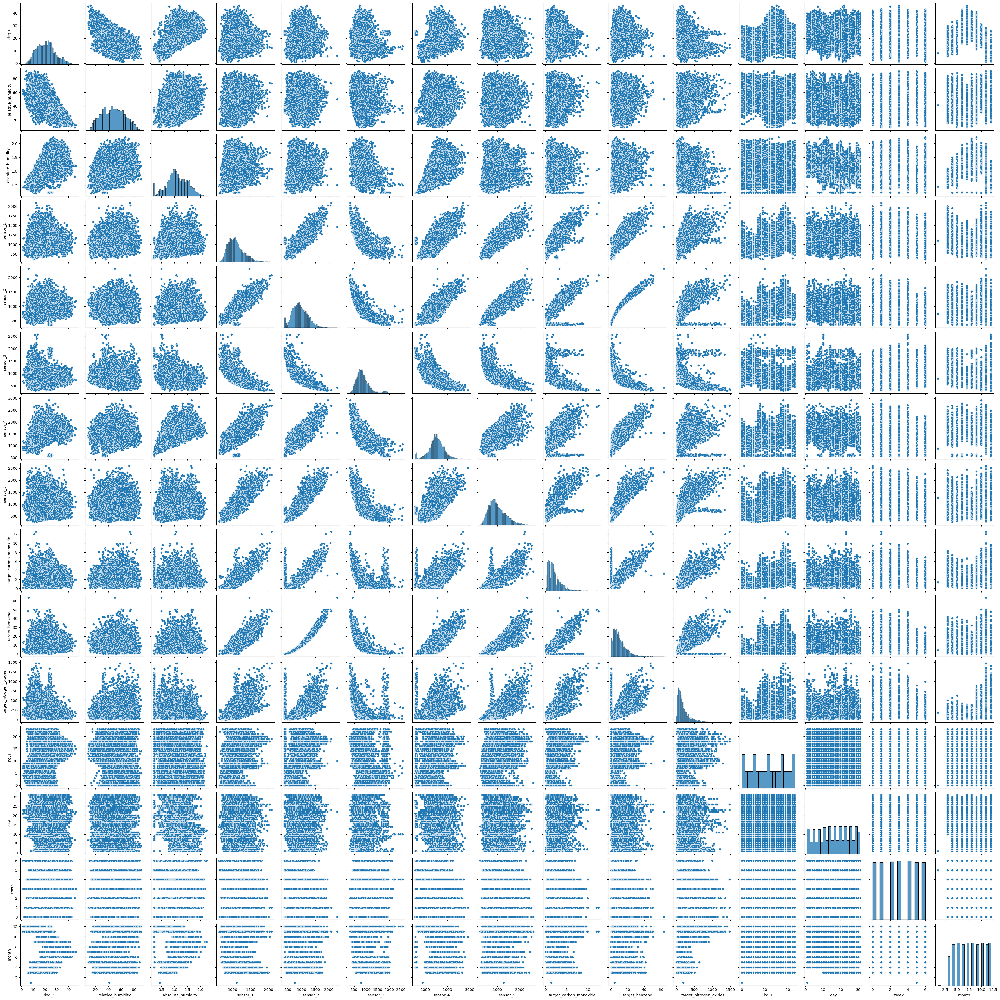

In [15]:
#plot all possible grpahs to understand the relationship between different features and target
sns.pairplot(data)

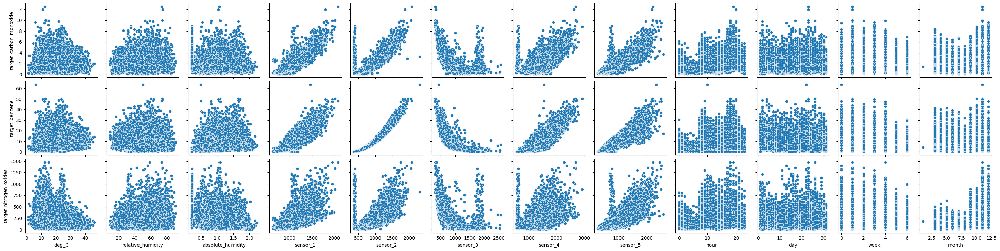

In [16]:
# pair plot of the target variables with the features

sns.pairplot(data, x_vars=['deg_C', 'relative_humidity', 'absolute_humidity', 'sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5','hour', 'day', 'week', 'month'], y_vars=['target_carbon_monoxide', 'target_benzene', 'target_nitrogen_oxides'])

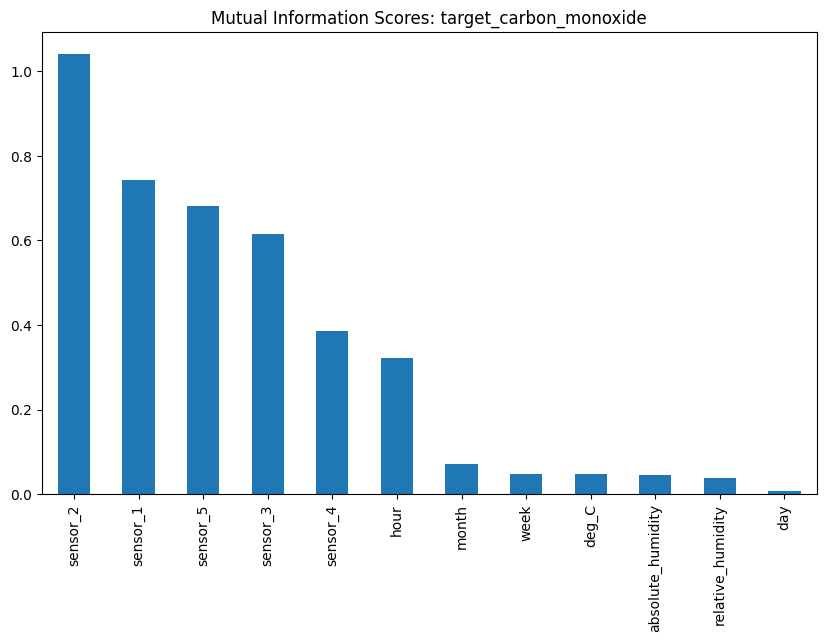

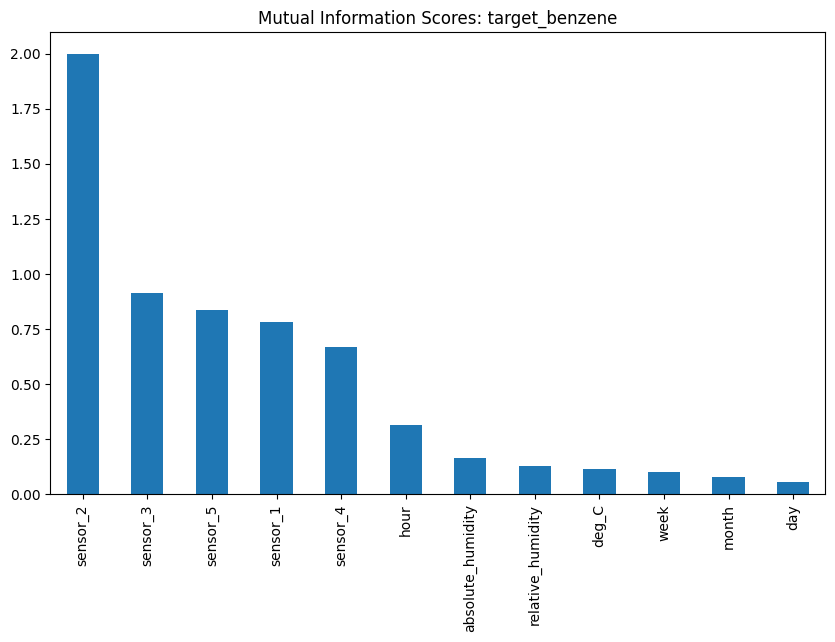

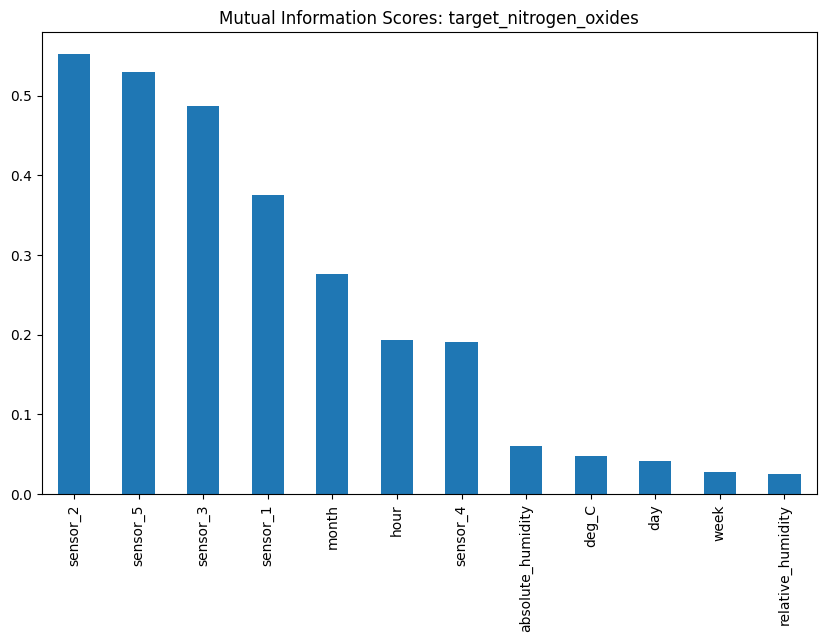

In [17]:
# get the relevant features 
from sklearn.feature_selection import mutual_info_regression as mi

from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV 
from sklearn.model_selection import RandomizedSearchCV 



X = data.drop(['target_carbon_monoxide', 'target_benzene', 'target_nitrogen_oxides', 'date_time'], axis=1)

y1 = data['target_carbon_monoxide']
y2 = data['target_benzene'] 
y3 = data['target_nitrogen_oxides']



def mi_scores(X, y):
    mi_scores = mi(X, y)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    target_name = y.name
    #plot the scores
    plt.figure(figsize=(10,6))
    mi_scores.plot(kind='bar')
    plt.title(f'Mutual Information Scores: {target_name}')
    plt.show()
    return mi_scores

mi_scores_target_carbon_monoxide = mi_scores(X, y1)
mi_scores_target_benzene= mi_scores(X, y2)
mi_scores_target_nitrogen_oxides = mi_scores(X, y3)



In [18]:
# get the relevant features
relevant_features_target_carbon_monoxide = mi_scores_target_carbon_monoxide[mi_scores_target_carbon_monoxide > 0.1].index
relevant_features_target_benzene = mi_scores_target_benzene[mi_scores_target_benzene > 0.1].index
relevant_features_target_nitrogen_oxides = mi_scores_target_nitrogen_oxides[mi_scores_target_nitrogen_oxides > 0.1].index

print(relevant_features_target_carbon_monoxide)
print(relevant_features_target_benzene)
print(relevant_features_target_nitrogen_oxides)

Index(['sensor_2', 'sensor_1', 'sensor_5', 'sensor_3', 'sensor_4', 'hour'], dtype='object')
Index(['sensor_2', 'sensor_3', 'sensor_5', 'sensor_1', 'sensor_4', 'hour',
       'absolute_humidity', 'relative_humidity', 'deg_C', 'week'],
      dtype='object')
Index(['sensor_2', 'sensor_5', 'sensor_3', 'sensor_1', 'month', 'hour',
       'sensor_4'],
      dtype='object')


In [19]:
# data
X_target_carbon_monoxide = X[relevant_features_target_carbon_monoxide]
X_target_benzene = X[relevant_features_target_benzene]
X_target_nitrogen_oxides = X[relevant_features_target_nitrogen_oxides]




In [20]:
# split the data into training and testing sets


X_train_target_carbon_monoxide, X_test_target_carbon_monoxide, y_train_target_carbon_monoxide, y_test_target_carbon_monoxide = train_test_split(X_target_carbon_monoxide, y1, test_size=0.2, random_state=42)

X_train_target_benzene, X_test_target_benzene, y_train_target_benzene, y_test_target_benzene = train_test_split(X_target_benzene, y2, test_size=0.2, random_state=42)

X_train_target_nitrogen_oxides, X_test_target_nitrogen_oxides, y_train_target_nitrogen_oxides, y_test_target_nitrogen_oxides = train_test_split(X_target_nitrogen_oxides, y3, test_size=0.2, random_state=42)


In [21]:
# get best model using random search for XBGRegressor

def get_best_XGBR_model(X_train, y_train):
    model = XGBRegressor()
    param_grid = {
        'n_estimators': [100, 500, 1000],
        'max_depth': [3, 5, 7],
        'learning_rate': [0.01, 0.1, 0.3],
        'subsample': [0.5, 0.7, 1],
        'colsample_bytree': [0.5, 0.7, 1],
        'gamma': [0, 0.1, 0.2],
        'objective': ['reg:squarederror']

    }   

    random_search = RandomizedSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=2) # cv - cross validation ; n_jobs - number of jobs to run in parallel
    random_search.fit(X_train, y_train)
    best_model = random_search.best_estimator_
    return best_model


best_XGBR_model_target_carbon_monoxide = get_best_XGBR_model(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

best_XGBR_model_target_benzene = get_best_XGBR_model(X_train_target_benzene, y_train_target_benzene)

best_XGBR_model_target_nitrogen_oxides = get_best_XGBR_model(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [22]:
# get the predictions for the test data using the best model for each target variable

target_XBGR_carbon_monoxide_predictions = best_XGBR_model_target_carbon_monoxide.predict(X_test_target_carbon_monoxide)

target_XBGR_benzene_predictions = best_XGBR_model_target_benzene.predict(X_test_target_benzene)

target_XBGR_nitrogen_oxides_predictions = best_XGBR_model_target_nitrogen_oxides.predict(X_test_target_nitrogen_oxides)

# get the mean squared error and r2 score for each target variable

mean_squared_error_target_carbon_monoxide_XBGR = mean_squared_error(y_test_target_carbon_monoxide, target_XBGR_carbon_monoxide_predictions)
r2_score_target_carbon_monoxide_XBGR = r2_score(y_test_target_carbon_monoxide, target_XBGR_carbon_monoxide_predictions)

mean_squared_error_target_benzene_XBGR = mean_squared_error(y_test_target_benzene, target_XBGR_benzene_predictions)
r2_score_target_benzene_XBGR = r2_score(y_test_target_benzene, target_XBGR_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_XBGR = mean_squared_error(y_test_target_nitrogen_oxides, target_XBGR_nitrogen_oxides_predictions)
r2_score_target_nitrogen_oxides_XBGR = r2_score(y_test_target_nitrogen_oxides, target_XBGR_nitrogen_oxides_predictions)


In [23]:



print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_XBGR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_XBGR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_XBGR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_XBGR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_XBGR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_XBGR}')



# get combined r2 score for all the target variables	
r2_score_combined =  (r2_score_target_carbon_monoxide_XBGR + r2_score_target_benzene_XBGR + r2_score_target_nitrogen_oxides_XBGR) / 3

print(f'Combined R2 Score: {r2_score_combined}')


Mean Squared Error for target_carbon_monoxide: 0.20222546128086313
R2 Score for target_carbon_monoxide: 0.9126592820913555
Mean Squared Error for target_benzene: 1.5168399380747855
R2 Score for target_benzene: 0.9768338065664108
Mean Squared Error for target_nitrogen_oxides: 4307.636177038174
R2 Score for target_nitrogen_oxides: 0.8898062484132641
Combined R2 Score: 0.9264331123570102


In [97]:
# get the best model using random search for SVM regressor

from sklearn.svm import SVR

def get_best_SVR_model(X_train, y_train):
    model = SVR()
    param_grid = {
        'C': [0.1, 1, 10],
        'epsilon': [0.1, 0.2, 0.5, 0.3],
        'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    }   

    random_search = RandomizedSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=2)
    random_search.fit(X_train, y_train)
    best_model = random_search.best_estimator_
    return best_model

best_SVR_model_target_carbon_monoxide = get_best_SVR_model(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

best_SVR_model_target_benzene = get_best_SVR_model(X_train_target_benzene, y_train_target_benzene)

best_SVR_model_target_nitrogen_oxides = get_best_SVR_model(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [98]:

# get the predictions for the test data using the best model for each target variable

target_SVR_carbon_monoxide_predictions = best_SVR_model_target_carbon_monoxide.predict(X_test_target_carbon_monoxide)

target_SVR_benzene_predictions = best_SVR_model_target_benzene.predict(X_test_target_benzene)

target_SVR_nitrogen_oxides_predictions = best_SVR_model_target_nitrogen_oxides.predict(X_test_target_nitrogen_oxides)

# get the mean squared error and r2 score for each target variable

mean_squared_error_target_carbon_monoxide_SVR = mean_squared_error(y_test_target_carbon_monoxide, target_SVR_carbon_monoxide_predictions)

r2_score_target_carbon_monoxide_SVR = r2_score(y_test_target_carbon_monoxide, target_SVR_carbon_monoxide_predictions)

mean_squared_error_target_benzene_SVR = mean_squared_error(y_test_target_benzene, target_SVR_benzene_predictions)

r2_score_target_benzene_SVR = r2_score(y_test_target_benzene, target_SVR_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_SVR = mean_squared_error(y_test_target_nitrogen_oxides, target_SVR_nitrogen_oxides_predictions)

r2_score_target_nitrogen_oxides_SVR = r2_score(y_test_target_nitrogen_oxides, target_SVR_nitrogen_oxides_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_SVR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_SVR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_SVR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_SVR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_SVR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_SVR}')

# get combined r2 score for all the target variables	

r2_score_combined_SVR =  (r2_score_target_carbon_monoxide_SVR + r2_score_target_benzene_SVR + r2_score_target_nitrogen_oxides_SVR) / 3

print(f'Combined R2 Score: {r2_score_combined_SVR}')





Mean Squared Error for target_carbon_monoxide: 0.277794104729558
R2 Score for target_carbon_monoxide: 0.8800213564395276
Mean Squared Error for target_benzene: 2.239842678349487
R2 Score for target_benzene: 0.9657916254411714
Mean Squared Error for target_nitrogen_oxides: 11167.794774354245
R2 Score for target_nitrogen_oxides: 0.7143163552909464
Combined R2 Score: 0.8533764457238817


In [ ]:
# get the best model using random search for RandomForestRegressor

from sklearn.ensemble import RandomForestRegressor

def get_best_RFR_model(X_train, y_train):
    model = RandomForestRegressor()
    param_grid = {
        'n_estimators': [100, 500, 1000],
        'max_depth': [3, 5, 7],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
        
    }   

    random_search = RandomizedSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=2)
    random_search.fit(X_train, y_train)
    best_model = random_search.best_estimator_
    return best_model

best_RFR_model_target_carbon_monoxide = get_best_RFR_model(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

best_RFR_model_target_benzene = get_best_RFR_model(X_train_target_benzene, y_train_target_benzene)

best_RFR_model_target_nitrogen_oxides = get_best_RFR_model(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)



In [ ]:
# get the predictions for the test data using the best model for each target variable

target_RFR_carbon_monoxide_predictions = best_RFR_model_target_carbon_monoxide.predict(X_test_target_carbon_monoxide)

target_RFR_benzene_predictions = best_RFR_model_target_benzene.predict(X_test_target_benzene)

target_RFR_nitrogen_oxides_predictions = best_RFR_model_target_nitrogen_oxides.predict(X_test_target_nitrogen_oxides)

# get the mean squared error and r2 score for each target variable

mean_squared_error_target_carbon_monoxide_RFR = mean_squared_error(y_test_target_carbon_monoxide, target_RFR_carbon_monoxide_predictions)

r2_score_target_carbon_monoxide_RFR = r2_score(y_test_target_carbon_monoxide, target_RFR_carbon_monoxide_predictions)

mean_squared_error_target_benzene_RFR = mean_squared_error(y_test_target_benzene, target_RFR_benzene_predictions)

r2_score_target_benzene_RFR = r2_score(y_test_target_benzene, target_RFR_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_RFR = mean_squared_error(y_test_target_nitrogen_oxides, target_RFR_nitrogen_oxides_predictions)

r2_score_target_nitrogen_oxides_RFR = r2_score(y_test_target_nitrogen_oxides, target_RFR_nitrogen_oxides_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_RFR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_RFR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_RFR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_RFR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_RFR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_RFR}')

# get combined r2 score for all the target variables	

r2_score_combined_RFR =  (r2_score_target_carbon_monoxide_RFR + r2_score_target_benzene_RFR + r2_score_target_nitrogen_oxides_RFR) / 3

print(f'Combined R2 Score: {r2_score_combined_RFR}')



Mean Squared Error for target_carbon_monoxide: 0.22772968636964572
R2 Score for target_carbon_monoxide: 0.9016440651406858
Mean Squared Error for target_benzene: 1.7247549736739574
R2 Score for target_benzene: 0.9736583891663684
Mean Squared Error for target_nitrogen_oxides: 4619.876400932088
R2 Score for target_nitrogen_oxides: 0.8818188232331714
Combined R2 Score: 0.9190404258467418


In [ ]:
# get the best model using random search for DecisionTreeRegressor

from sklearn.tree import DecisionTreeRegressor

def get_best_DTR_model(X_train, y_train):
    model = DecisionTreeRegressor()
    param_grid = {
        'max_depth': [3, 5, 7],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }   

    random_search = RandomizedSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=2)
    random_search.fit(X_train, y_train)
    best_model = random_search.best_estimator_
    return best_model

best_DTR_model_target_carbon_monoxide = get_best_DTR_model(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

best_DTR_model_target_benzene = get_best_DTR_model(X_train_target_benzene, y_train_target_benzene)

best_DTR_model_target_nitrogen_oxides = get_best_DTR_model(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [ ]:
# get the predictions for the test data using the best model for each target variable

target_DTR_carbon_monoxide_predictions = best_DTR_model_target_carbon_monoxide.predict(X_test_target_carbon_monoxide)

target_DTR_benzene_predictions = best_DTR_model_target_benzene.predict(X_test_target_benzene)

target_DTR_nitrogen_oxides_predictions = best_DTR_model_target_nitrogen_oxides.predict(X_test_target_nitrogen_oxides)

# get the mean squared error and r2 score for each target variable

mean_squared_error_target_carbon_monoxide_DTR = mean_squared_error(y_test_target_carbon_monoxide, target_DTR_carbon_monoxide_predictions)

r2_score_target_carbon_monoxide_DTR = r2_score(y_test_target_carbon_monoxide, target_DTR_carbon_monoxide_predictions)

mean_squared_error_target_benzene_DTR = mean_squared_error(y_test_target_benzene, target_DTR_benzene_predictions)

r2_score_target_benzene_DTR = r2_score(y_test_target_benzene, target_DTR_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_DTR = mean_squared_error(y_test_target_nitrogen_oxides, target_DTR_nitrogen_oxides_predictions)

r2_score_target_nitrogen_oxides_DTR = r2_score(y_test_target_nitrogen_oxides, target_DTR_nitrogen_oxides_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_DTR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_DTR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_DTR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_DTR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_DTR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_DTR}')

# get combined r2 score for all the target variables	

r2_score_combined_DTR =  (r2_score_target_carbon_monoxide_DTR + r2_score_target_benzene_DTR + r2_score_target_nitrogen_oxides_DTR) / 3

print(f'Combined R2 Score: {r2_score_combined_DTR}')



Mean Squared Error for target_carbon_monoxide: 0.2920139326718173
R2 Score for target_carbon_monoxide: 0.8738798450138748
Mean Squared Error for target_benzene: 2.2459901870249483
R2 Score for target_benzene: 0.9656977365795086
Mean Squared Error for target_nitrogen_oxides: 6703.930841905793
R2 Score for target_nitrogen_oxides: 0.8285065730979262
Combined R2 Score: 0.8893613848971033


In [ ]:
# get the best model using random search for KNeighborsRegressor

from sklearn.neighbors import KNeighborsRegressor

def get_best_KNR_model(X_train, y_train):
    model = KNeighborsRegressor()
    param_grid = {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance'],
        'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
    }   

    random_search = RandomizedSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=2)
    random_search.fit(X_train, y_train)
    best_model = random_search.best_estimator_
    return best_model

best_KNR_model_target_carbon_monoxide = get_best_KNR_model(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

best_KNR_model_target_benzene = get_best_KNR_model(X_train_target_benzene, y_train_target_benzene)

best_KNR_model_target_nitrogen_oxides = get_best_KNR_model(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)




Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [ ]:

# get the predictions for the test data using the best model for each target variable

target_KNR_carbon_monoxide_predictions = best_KNR_model_target_carbon_monoxide.predict(X_test_target_carbon_monoxide)

target_KNR_benzene_predictions = best_KNR_model_target_benzene.predict(X_test_target_benzene)

target_KNR_nitrogen_oxides_predictions = best_KNR_model_target_nitrogen_oxides.predict(X_test_target_nitrogen_oxides)

# get the mean squared error and r2 score for each target variable

mean_squared_error_target_carbon_monoxide_KNR = mean_squared_error(y_test_target_carbon_monoxide, target_KNR_carbon_monoxide_predictions)

r2_score_target_carbon_monoxide_KNR = r2_score(y_test_target_carbon_monoxide, target_KNR_carbon_monoxide_predictions)

mean_squared_error_target_benzene_KNR = mean_squared_error(y_test_target_benzene, target_KNR_benzene_predictions)

r2_score_target_benzene_KNR = r2_score(y_test_target_benzene, target_KNR_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_KNR = mean_squared_error(y_test_target_nitrogen_oxides, target_KNR_nitrogen_oxides_predictions)

r2_score_target_nitrogen_oxides_KNR = r2_score(y_test_target_nitrogen_oxides, target_KNR_nitrogen_oxides_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_KNR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_KNR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_KNR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_KNR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_KNR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_KNR}')

# get combined r2 score for all the target variables	

r2_score_combined_KNR =  (r2_score_target_carbon_monoxide_KNR + r2_score_target_benzene_KNR + r2_score_target_nitrogen_oxides_KNR) / 3

print(f'Combined R2 Score: {r2_score_combined_KNR}')



Mean Squared Error for target_carbon_monoxide: 0.27768015791709433
R2 Score for target_carbon_monoxide: 0.8800705698093029
Mean Squared Error for target_benzene: 2.3291730848736405
R2 Score for target_benzene: 0.9644273117617291
Mean Squared Error for target_nitrogen_oxides: 8788.910967599733
R2 Score for target_nitrogen_oxides: 0.7751706429980979
Combined R2 Score: 0.8732228415230433


In [ ]:
# get the best model using random search for polynomial regression

from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression

def get_best_PR_model(X_train, y_train):
    model = make_pipeline(PolynomialFeatures(), LinearRegression())
    param_grid = {
        'polynomialfeatures__degree': [2, 3, 4]
    }   

    random_search = RandomizedSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=2)
    random_search.fit(X_train, y_train)
    best_model = random_search.best_estimator_
    return best_model

best_PR_model_target_carbon_monoxide = get_best_PR_model(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

best_PR_model_target_benzene = get_best_PR_model(X_train_target_benzene, y_train_target_benzene)

best_PR_model_target_nitrogen_oxides = get_best_PR_model(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)



Fitting 5 folds for each of 3 candidates, totalling 15 fits


c:\Users\bhask\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\model_selection\_search.py:318: UserWarning: The total space of parameters 3 is smaller than n_iter=10. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
c:\Users\bhask\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\model_selection\_search.py:318: UserWarning: The total space of parameters 3 is smaller than n_iter=10. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 3 candidates, totalling 15 fits


c:\Users\bhask\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\model_selection\_search.py:318: UserWarning: The total space of parameters 3 is smaller than n_iter=10. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 3 candidates, totalling 15 fits


In [ ]:
# get the predictions for the test data using the best model for each target variable

target_PR_carbon_monoxide_predictions = best_PR_model_target_carbon_monoxide.predict(X_test_target_carbon_monoxide)

target_PR_benzene_predictions = best_PR_model_target_benzene.predict(X_test_target_benzene)

target_PR_nitrogen_oxides_predictions = best_PR_model_target_nitrogen_oxides.predict(X_test_target_nitrogen_oxides)

# get the mean squared error and r2 score for each target

mean_squared_error_target_carbon_monoxide_PR = mean_squared_error(y_test_target_carbon_monoxide, target_PR_carbon_monoxide_predictions)

r2_score_target_carbon_monoxide_PR = r2_score(y_test_target_carbon_monoxide, target_PR_carbon_monoxide_predictions)

mean_squared_error_target_benzene_PR = mean_squared_error(y_test_target_benzene, target_PR_benzene_predictions)

r2_score_target_benzene_PR = r2_score(y_test_target_benzene, target_PR_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_PR = mean_squared_error(y_test_target_nitrogen_oxides, target_PR_nitrogen_oxides_predictions)

r2_score_target_nitrogen_oxides_PR = r2_score(y_test_target_nitrogen_oxides, target_PR_nitrogen_oxides_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_PR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_PR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_PR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_PR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_PR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_PR}')

# get combined r2 score for all the target variables	

r2_score_combined_PR =  (r2_score_target_carbon_monoxide_PR + r2_score_target_benzene_PR + r2_score_target_nitrogen_oxides_PR) / 3

print(f'Combined R2 Score: {r2_score_combined_PR}')



Mean Squared Error for target_carbon_monoxide: 0.2346123722026471
R2 Score for target_carbon_monoxide: 0.8986714487451712
Mean Squared Error for target_benzene: 1.5469392130184767
R2 Score for target_benzene: 0.9763741103202523
Mean Squared Error for target_nitrogen_oxides: 5372.641330422772
R2 Score for target_nitrogen_oxides: 0.862562324254528
Combined R2 Score: 0.9125359611066505


In [ ]:
# get the best model using random search for multiple linear regression

def get_best_MLR_model(X_train, y_train):
    model = LinearRegression()
    param_grid = {
        'fit_intercept': [True, False]


        
    }   

    random_search = RandomizedSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=2)
    random_search.fit(X_train, y_train)
    best_model = random_search.best_estimator_
    return best_model

best_MLR_model_target_carbon_monoxide = get_best_MLR_model(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

best_MLR_model_target_benzene = get_best_MLR_model(X_train_target_benzene, y_train_target_benzene)

best_MLR_model_target_nitrogen_oxides = get_best_MLR_model(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)



Fitting 5 folds for each of 2 candidates, totalling 10 fits
Fitting 5 folds for each of 2 candidates, totalling 10 fits
Fitting 5 folds for each of 2 candidates, totalling 10 fits


c:\Users\bhask\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\model_selection\_search.py:318: UserWarning: The total space of parameters 2 is smaller than n_iter=10. Running 2 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
c:\Users\bhask\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\model_selection\_search.py:318: UserWarning: The total space of parameters 2 is smaller than n_iter=10. Running 2 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
c:\Users\bhask\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\model_selection\_search.py:318: UserWarning: The total space of parameters 2 is smaller than n_iter=10. Running 2 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


In [ ]:
# get the predictions for the test data using the best model for each target variable

target_MLR_carbon_monoxide_predictions = best_MLR_model_target_carbon_monoxide.predict(X_test_target_carbon_monoxide)

target_MLR_benzene_predictions = best_MLR_model_target_benzene.predict(X_test_target_benzene)

target_MLR_nitrogen_oxides_predictions = best_MLR_model_target_nitrogen_oxides.predict(X_test_target_nitrogen_oxides)


# get the mean squared error and r2 score for each target

mean_squared_error_target_carbon_monoxide_MLR = mean_squared_error(y_test_target_carbon_monoxide, target_MLR_carbon_monoxide_predictions)

r2_score_target_carbon_monoxide_MLR = r2_score(y_test_target_carbon_monoxide, target_MLR_carbon_monoxide_predictions)

mean_squared_error_target_benzene_MLR = mean_squared_error(y_test_target_benzene, target_MLR_benzene_predictions)

r2_score_target_benzene_MLR = r2_score(y_test_target_benzene, target_MLR_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_MLR = mean_squared_error(y_test_target_nitrogen_oxides, target_MLR_nitrogen_oxides_predictions)

r2_score_target_nitrogen_oxides_MLR = r2_score(y_test_target_nitrogen_oxides, target_MLR_nitrogen_oxides_predictions)


print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_MLR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_MLR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_MLR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_MLR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_MLR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_MLR}')


# get combined r2 score for all the target variables	

r2_score_combined_MLR =  (r2_score_target_carbon_monoxide_MLR + r2_score_target_benzene_MLR + r2_score_target_nitrogen_oxides_MLR) / 3

print(f'Combined R2 Score: {r2_score_combined_MLR}')

Mean Squared Error for target_carbon_monoxide: 0.3824257363498317
R2 Score for target_carbon_monoxide: 0.8348311921358582
Mean Squared Error for target_benzene: 3.368287878443101
R2 Score for target_benzene: 0.948557256060211
Mean Squared Error for target_nitrogen_oxides: 10025.168263538244
R2 Score for target_nitrogen_oxides: 0.743545913386043
Combined R2 Score: 0.842311453860704


In [ ]:
# get the best model using random search for elastik net regression

from sklearn.linear_model import ElasticNet

def get_best_ENR_model(X_train, y_train):
    model = ElasticNet()
    param_grid = {
        'alpha': [0.1, 0.5, 1],
        'l1_ratio': [0.1, 0.5, 1],
        'fit_intercept': [True, False],
        
    }   

    random_search = RandomizedSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=2)
    random_search.fit(X_train, y_train)
    best_model = random_search.best_estimator_
    return best_model

best_ENR_model_target_carbon_monoxide = get_best_ENR_model(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

best_ENR_model_target_benzene = get_best_ENR_model(X_train_target_benzene, y_train_target_benzene)

best_ENR_model_target_nitrogen_oxides = get_best_ENR_model(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)



Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [ ]:
# get the predictions for the test data using the best model for each target variable

target_ENR_carbon_monoxide_predictions = best_ENR_model_target_carbon_monoxide.predict(X_test_target_carbon_monoxide)

target_ENR_benzene_predictions = best_ENR_model_target_benzene.predict(X_test_target_benzene)

target_ENR_nitrogen_oxides_predictions = best_ENR_model_target_nitrogen_oxides.predict(X_test_target_nitrogen_oxides)

# get the mean squared error and r2 score for each target

mean_squared_error_target_carbon_monoxide_ENR = mean_squared_error(y_test_target_carbon_monoxide, target_ENR_carbon_monoxide_predictions)

r2_score_target_carbon_monoxide_ENR = r2_score(y_test_target_carbon_monoxide, target_ENR_carbon_monoxide_predictions)

mean_squared_error_target_benzene_ENR = mean_squared_error(y_test_target_benzene, target_ENR_benzene_predictions)

r2_score_target_benzene_ENR = r2_score(y_test_target_benzene, target_ENR_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_ENR = mean_squared_error(y_test_target_nitrogen_oxides, target_ENR_nitrogen_oxides_predictions)

r2_score_target_nitrogen_oxides_ENR = r2_score(y_test_target_nitrogen_oxides, target_ENR_nitrogen_oxides_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_ENR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_ENR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_ENR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_ENR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_ENR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_ENR}')

# get combined r2 score for all the target variables	

r2_score_combined_ENR =  (r2_score_target_carbon_monoxide_ENR + r2_score_target_benzene_ENR + r2_score_target_nitrogen_oxides_ENR) / 3

print(f'Combined R2 Score: {r2_score_combined_ENR}')


Mean Squared Error for target_carbon_monoxide: 0.3827379306118937
R2 Score for target_carbon_monoxide: 0.8346963561423946
Mean Squared Error for target_benzene: 3.374125026557286
R2 Score for target_benzene: 0.948468107232494
Mean Squared Error for target_nitrogen_oxides: 10028.91838636623
R2 Score for target_nitrogen_oxides: 0.7434499813977453
Combined R2 Score: 0.8422048149242113


In [ ]:
# print all the r2 score for all the models

print(f'Combined R2 Score for XGBRegressor: {r2_score_combined}')

print(f'Combined R2 Score for SVR: {r2_score_combined_SVR}')

print(f'Combined R2 Score for RandomForestRegressor: {r2_score_combined_RFR}')

print(f'Combined R2 Score for DecisionTreeRegressor: {r2_score_combined_DTR}')


print(f'Combined R2 Score for KNeighborsRegressor: {r2_score_combined_KNR}')

print(f'Combined R2 Score for Polynomial Regression: {r2_score_combined_PR}')

#print(f'Combined R2 Score for Multiple Linear Regression: {r2_score_combined_MLR}')


#print(f'Combined R2 Score for Elastic Net Regression: {r2_score_combined_ENR}')


Combined R2 Score for XGBRegressor: 0.9270727792843839
Combined R2 Score for SVR: 0.8533764457238817
Combined R2 Score for RandomForestRegressor: 0.9190404258467418
Combined R2 Score for DecisionTreeRegressor: 0.8893613848971033
Combined R2 Score for KNeighborsRegressor: 0.8732228415230433
Combined R2 Score for Polynomial Regression: 0.9125359611066505


In [ ]:
print('****************************************************************************************************')

# print the r2 score for carbon_monoxide for all the models
print(f'R2 Score for target_carbon_monoxide for XGBRegressor: {r2_score_target_carbon_monoxide_XBGR}')
print(f'R2 Score for target_carbon_monoxide for SVR: {r2_score_target_carbon_monoxide_SVR}')
print(f'R2 Score for target_carbon_monoxide for RandomForestRegressor: {r2_score_target_carbon_monoxide_RFR}')
print(f'R2 Score for target_carbon_monoxide for DecisionTreeRegressor: {r2_score_target_carbon_monoxide_DTR}')
print(f'R2 Score for target_carbon_monoxide for KNeighborsRegressor: {r2_score_target_carbon_monoxide_KNR}')
print(f'R2 Score for target_carbon_monoxide for Polynomial Regression: {r2_score_target_carbon_monoxide_PR}')
print(f'R2 Score for target_carbon_monoxide for Multiple Linear Regression: {r2_score_target_carbon_monoxide_MLR}')
print(f'R2 Score for target_carbon_monoxide for Elastic Net Regression: {r2_score_target_carbon_monoxide_ENR}')

print('****************************************************************************************************')
# print the r2 score for benzene for all the models
print(f'R2 Score for target_benzene for XGBRegressor: {r2_score_target_benzene_XBGR}')
print(f'R2 Score for target_benzene for SVR: {r2_score_target_benzene_SVR}')
print(f'R2 Score for target_benzene for RandomForestRegressor: {r2_score_target_benzene_RFR}')
print(f'R2 Score for target_benzene for DecisionTreeRegressor: {r2_score_target_benzene_DTR}')
print(f'R2 Score for target_benzene for KNeighborsRegressor: {r2_score_target_benzene_KNR}')
print(f'R2 Score for target_benzene for Polynomial Regression: {r2_score_target_benzene_PR}')
print(f'R2 Score for target_benzene for Multiple Linear Regression: {r2_score_target_benzene_MLR}')
print(f'R2 Score for target_benzene for Elastic Net Regression: {r2_score_target_benzene_ENR}')

print('****************************************************************************************************')

# print the r2 score for nitrogen_oxides for all the models
print(f'R2 Score for target_nitrogen_oxides for XGBRegressor: {r2_score_target_nitrogen_oxides_XBGR}')
print(f'R2 Score for target_nitrogen_oxides for SVR: {r2_score_target_nitrogen_oxides_SVR}')
print(f'R2 Score for target_nitrogen_oxides for RandomForestRegressor: {r2_score_target_nitrogen_oxides_RFR}')
print(f'R2 Score for target_nitrogen_oxides for DecisionTreeRegressor: {r2_score_target_nitrogen_oxides_DTR}')
print(f'R2 Score for target_nitrogen_oxides for KNeighborsRegressor: {r2_score_target_nitrogen_oxides_KNR}')
print(f'R2 Score for target_nitrogen_oxides for Polynomial Regression: {r2_score_target_nitrogen_oxides_PR}')
print(f'R2 Score for target_nitrogen_oxides for Multiple Linear Regression: {r2_score_target_nitrogen_oxides_MLR}')
print(f'R2 Score for target_nitrogen_oxides for Elastic Net Regression: {r2_score_target_nitrogen_oxides_ENR}')


****************************************************************************************************
R2 Score for target_carbon_monoxide for XGBRegressor: 0.9127647530794851
R2 Score for target_carbon_monoxide for SVR: 0.8800213564395276
R2 Score for target_carbon_monoxide for RandomForestRegressor: 0.9016440651406858
R2 Score for target_carbon_monoxide for DecisionTreeRegressor: 0.8738798450138748
R2 Score for target_carbon_monoxide for KNeighborsRegressor: 0.8800705698093029
R2 Score for target_carbon_monoxide for Polynomial Regression: 0.8986714487451712
R2 Score for target_carbon_monoxide for Multiple Linear Regression: 0.8348311921358582
R2 Score for target_carbon_monoxide for Elastic Net Regression: 0.8346963561423946
****************************************************************************************************
R2 Score for target_benzene for XGBRegressor: 0.9763747715283575
R2 Score for target_benzene for SVR: 0.9657916254411714
R2 Score for target_benzene for RandomForest

# Best model for each target chossed based on the r2 score but for confidence residual analysis was done

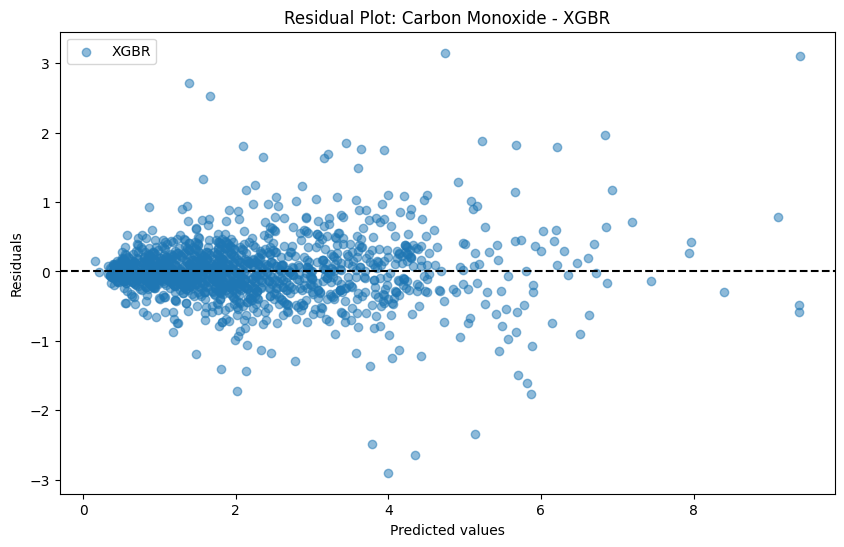

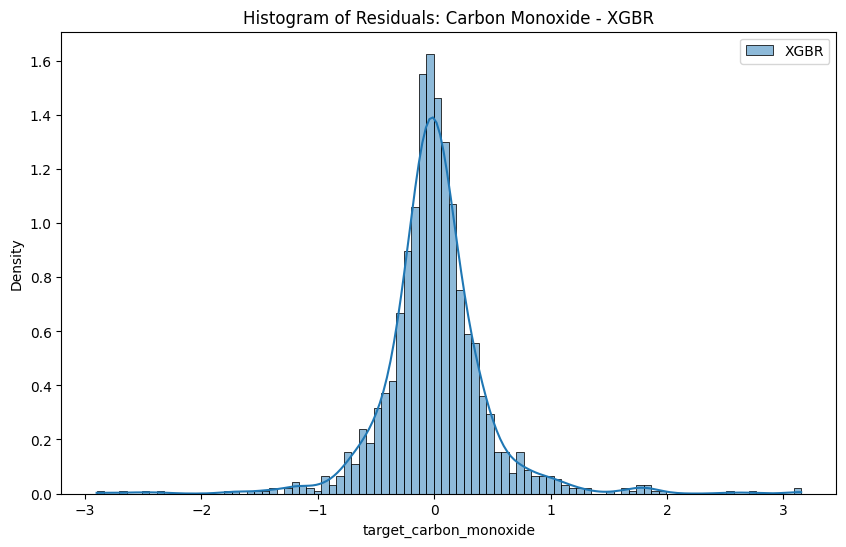

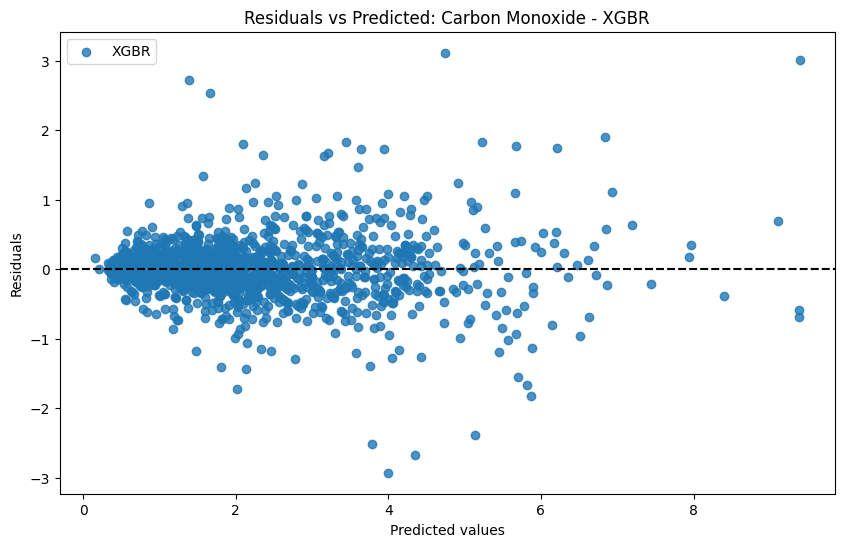

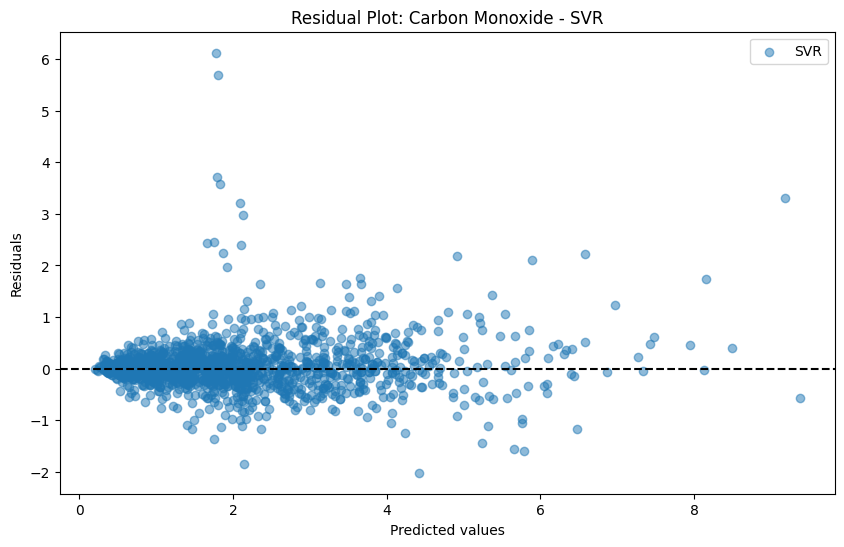

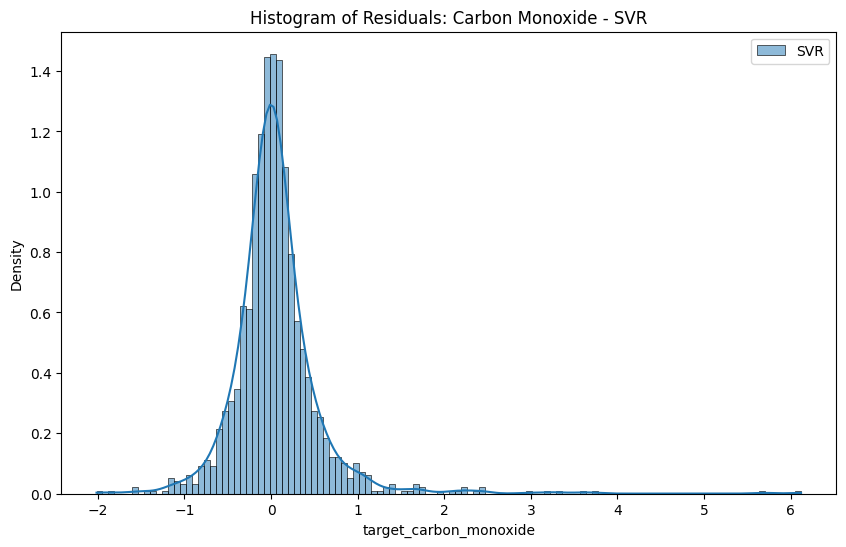

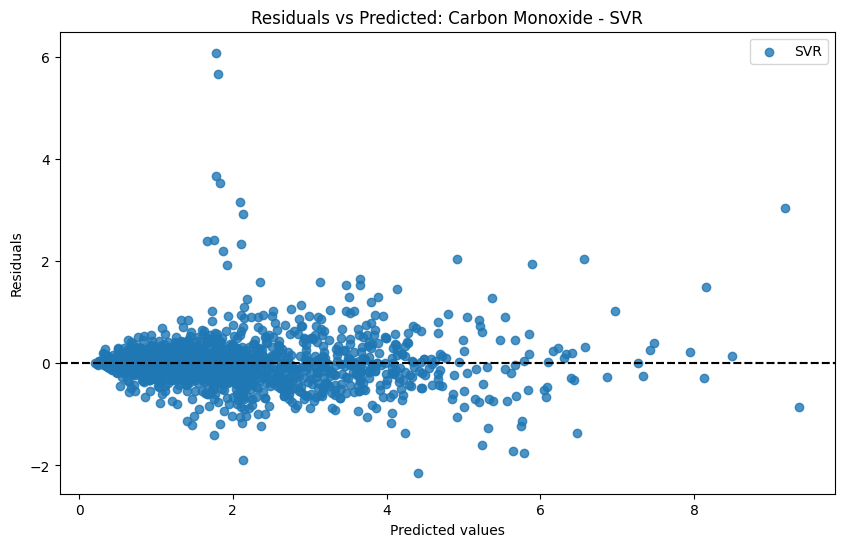

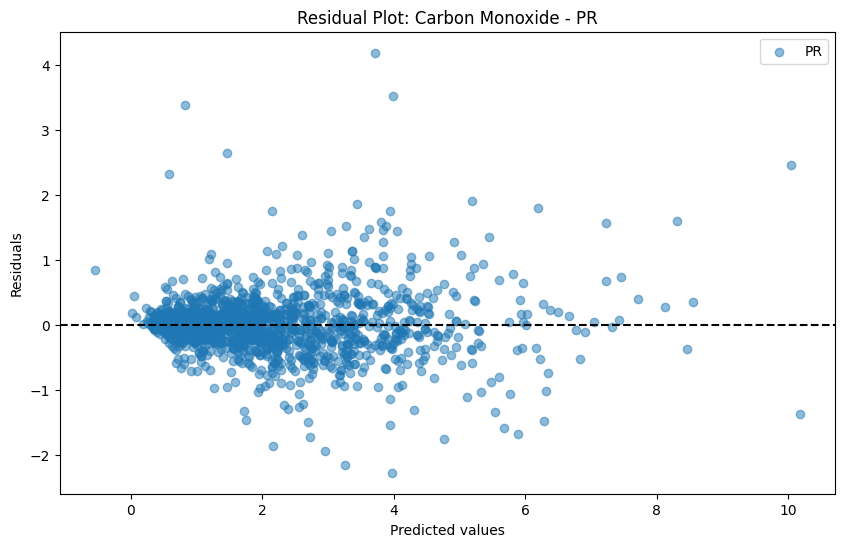

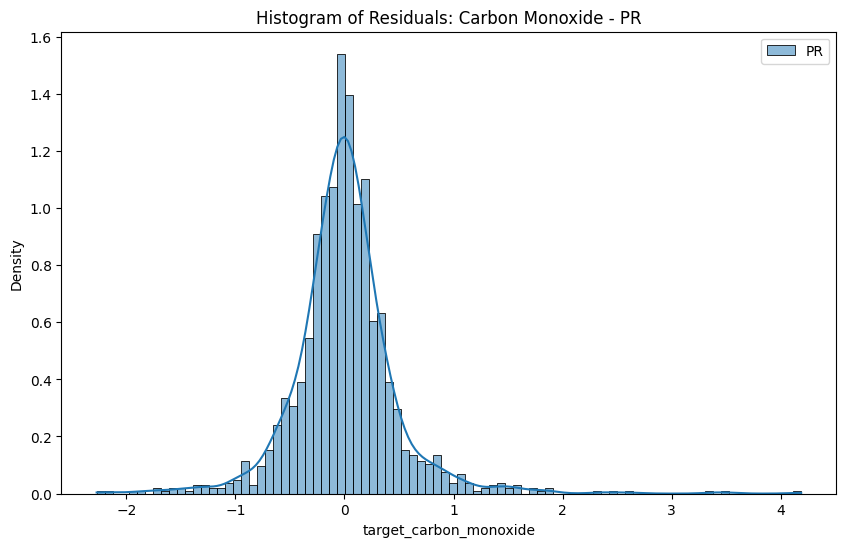

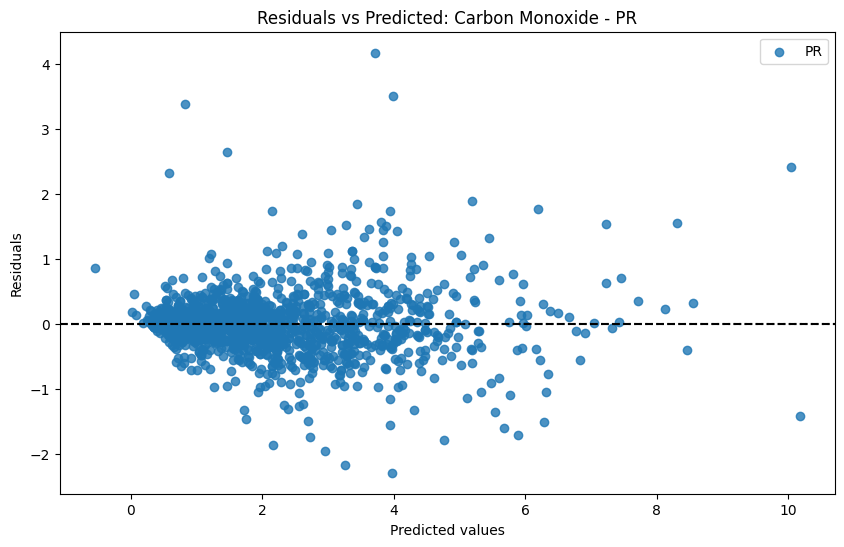

RSS for XGBR (Carbon Monoxide): 287.4193296556512
RSS for SVR (Carbon Monoxide): 395.301011030161
RSS for PR (Carbon Monoxide): 333.85340564436683


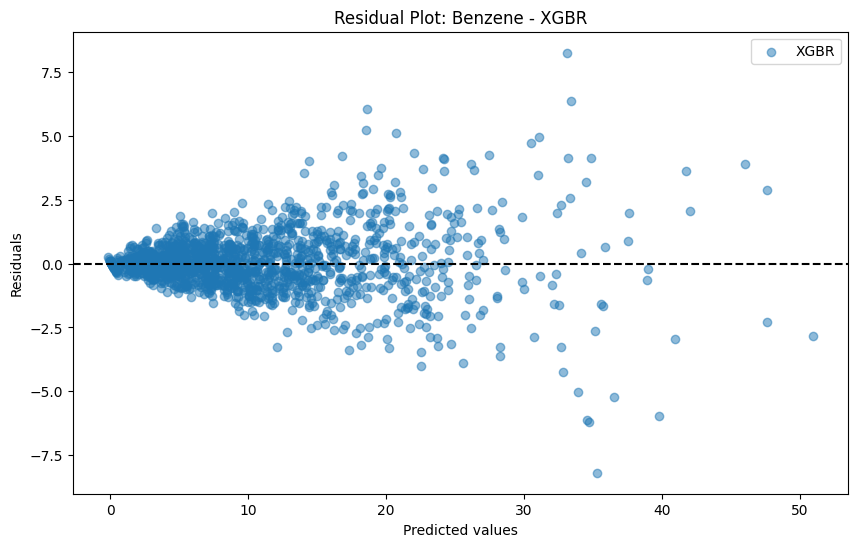

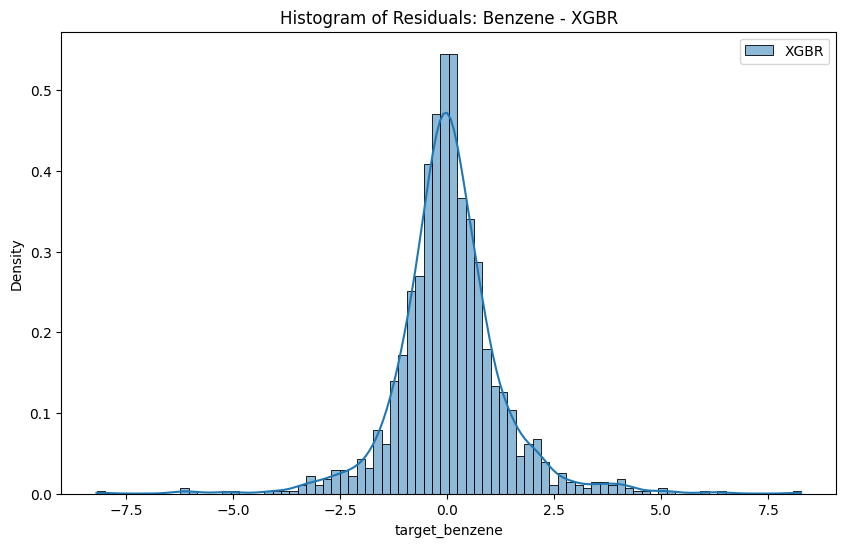

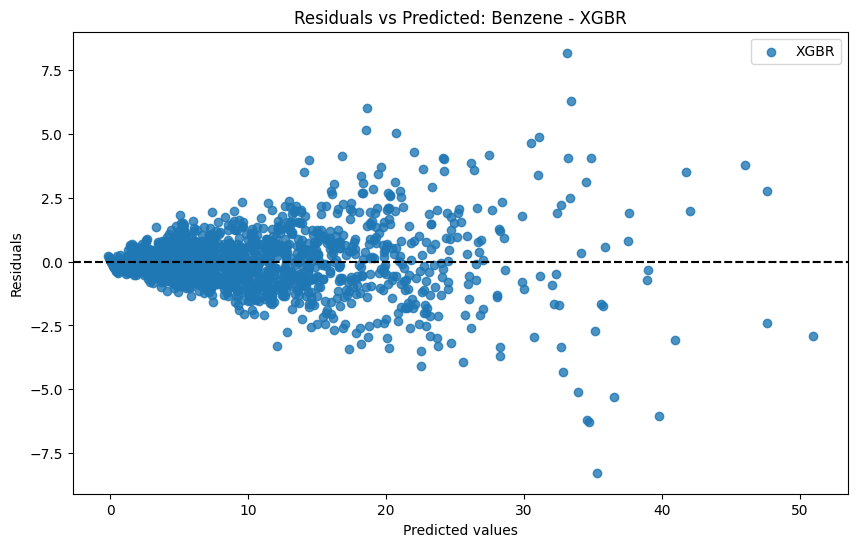

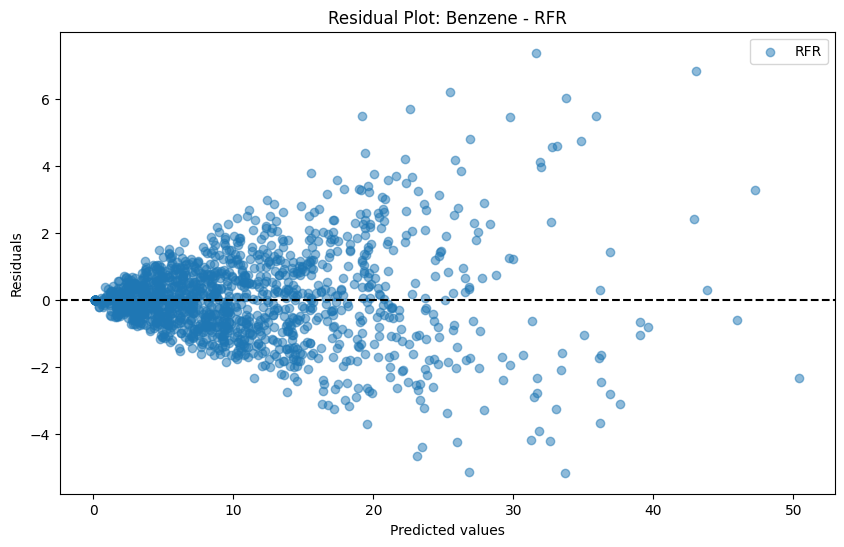

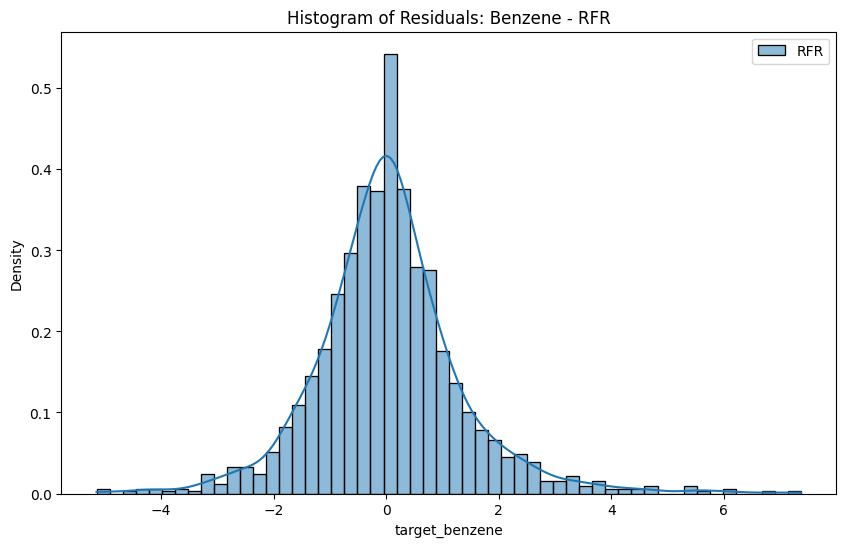

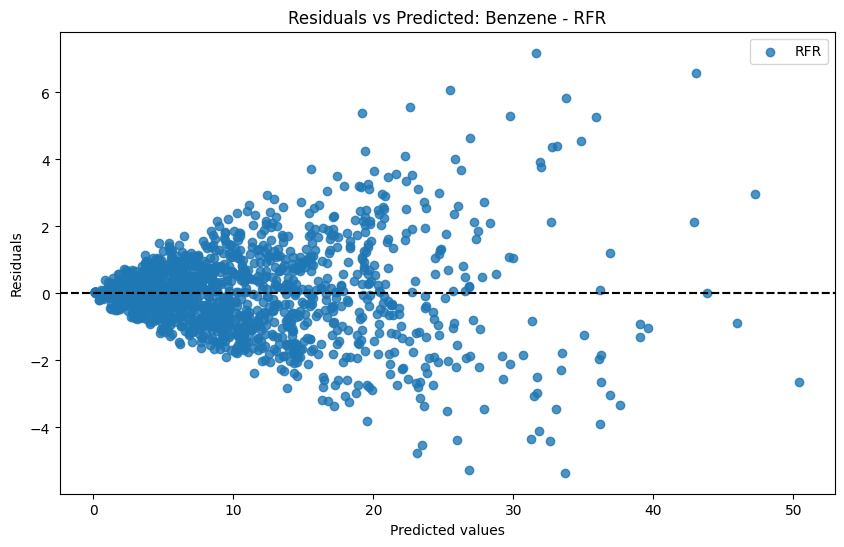

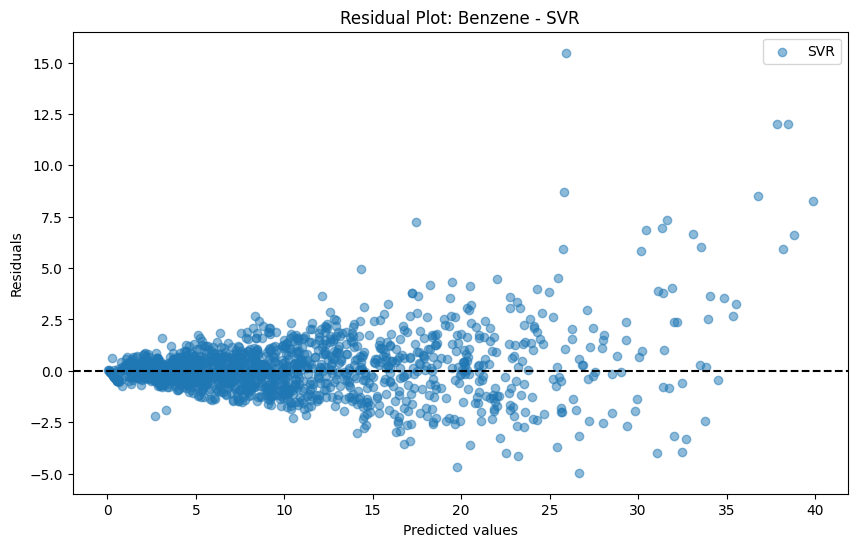

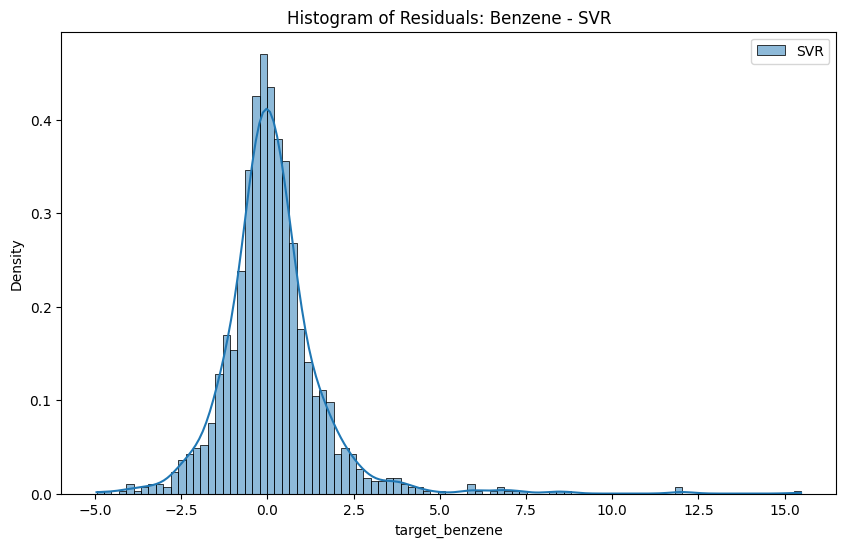

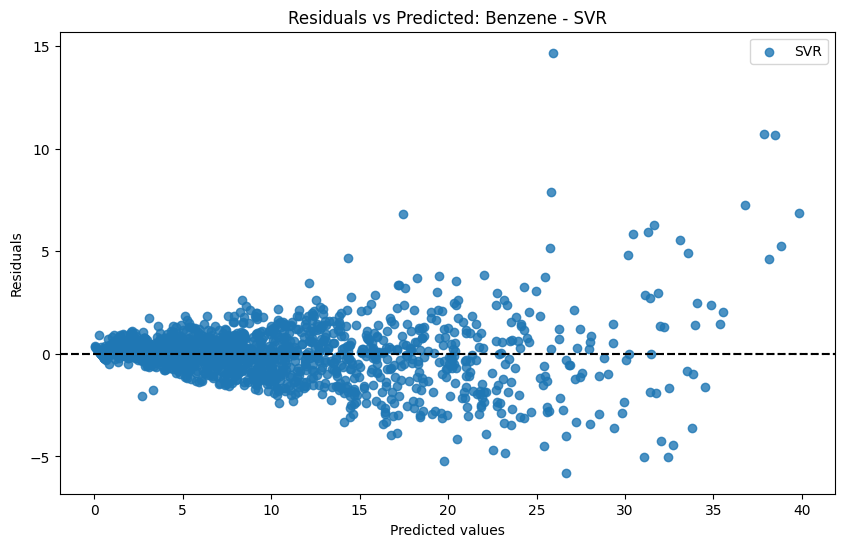

RSS for XGBR (Benzene): 2201.2328933970266
RSS for RFR (Benzene): 2454.3263275380414
RSS for SVR (Benzene): 3187.2961312913203


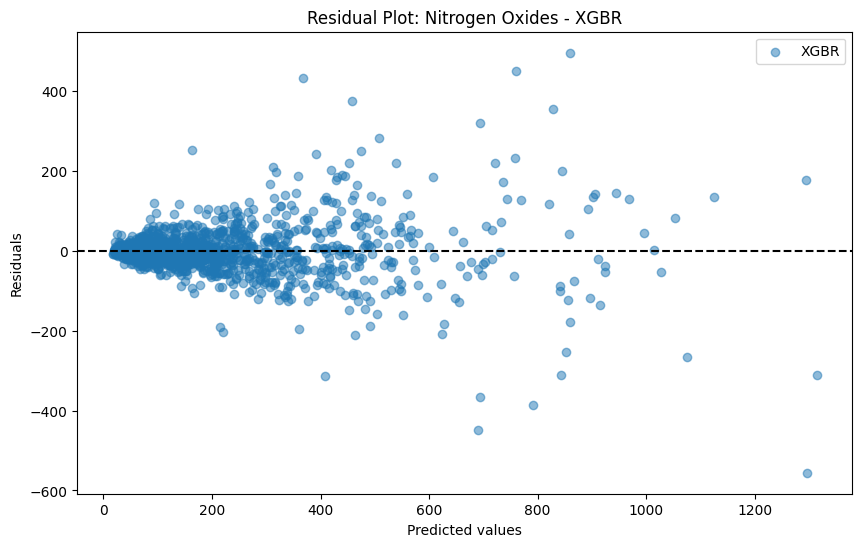

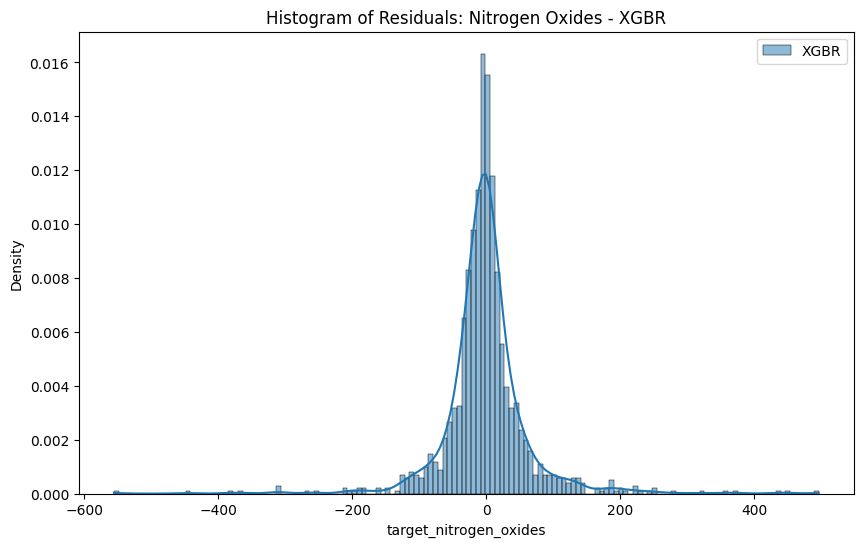

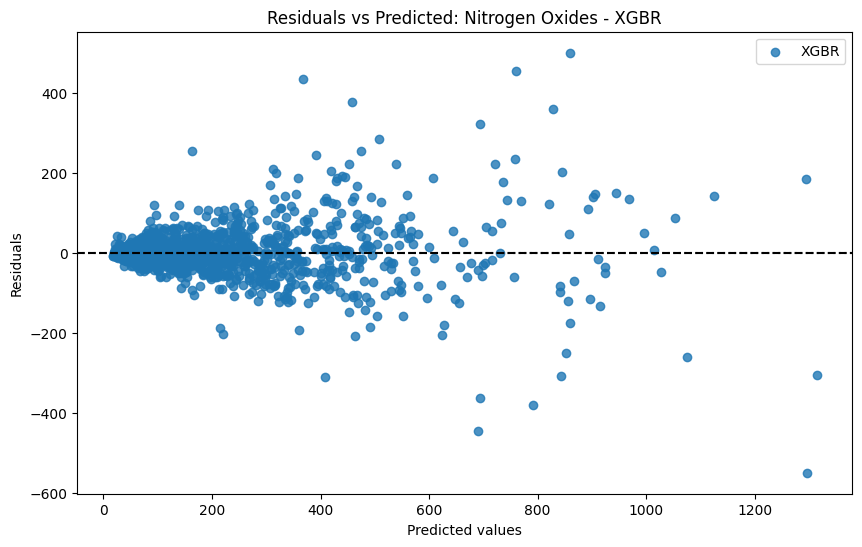

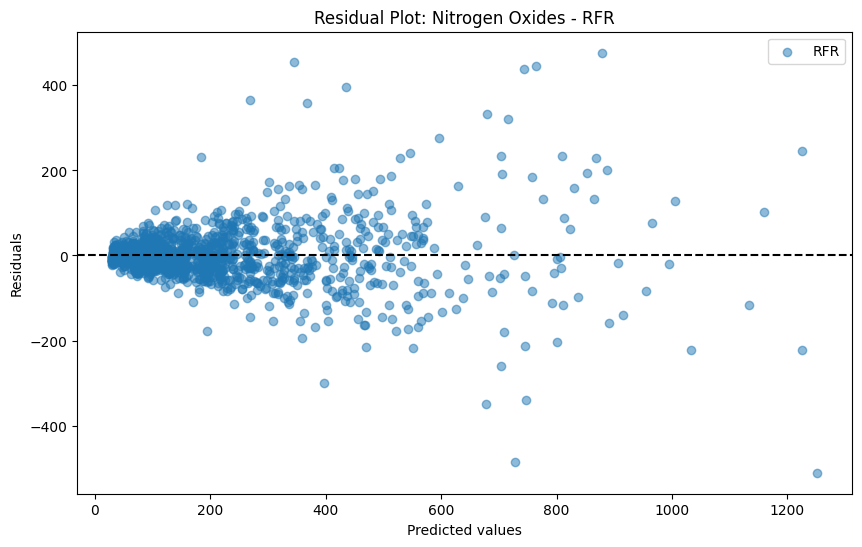

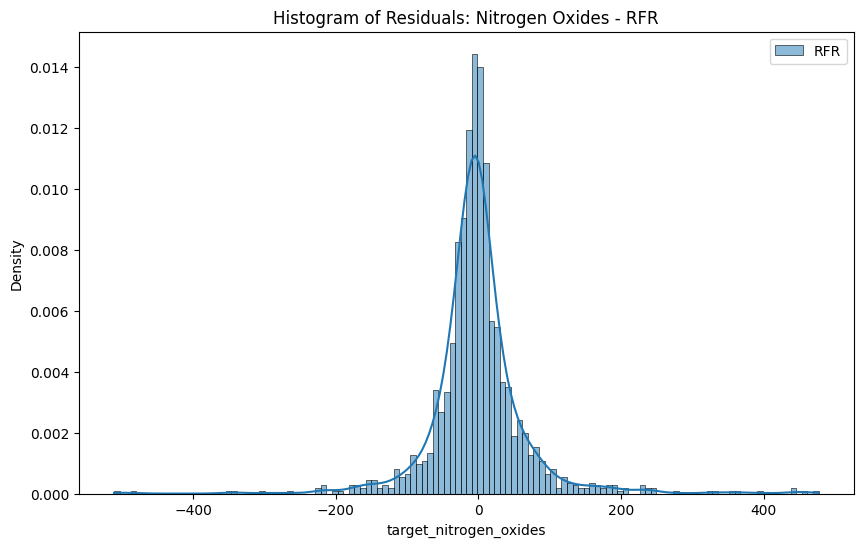

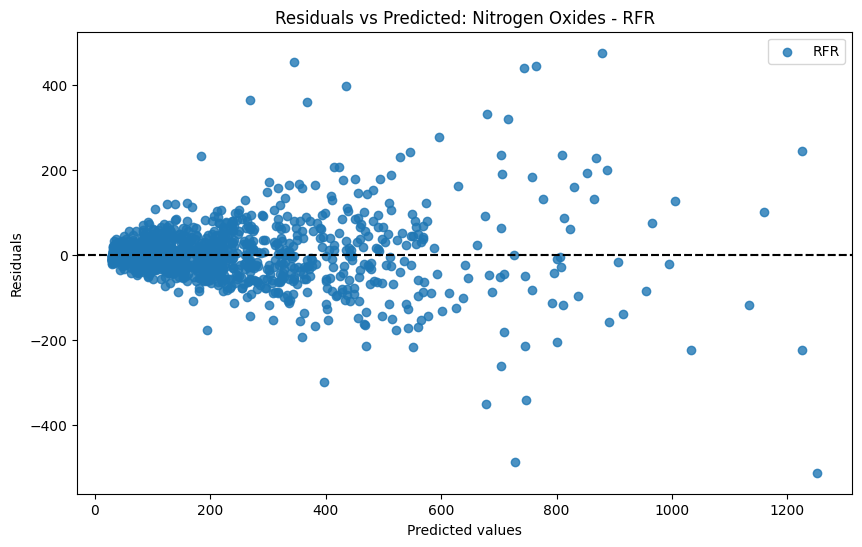

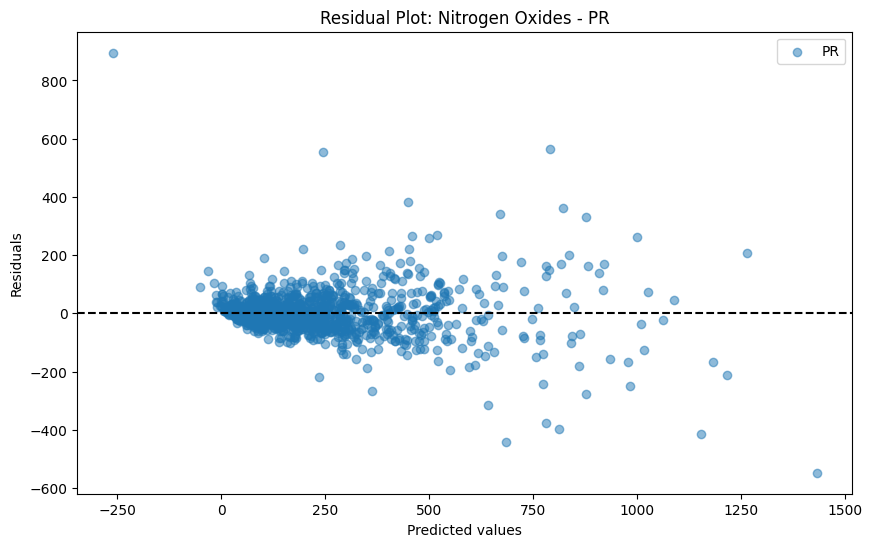

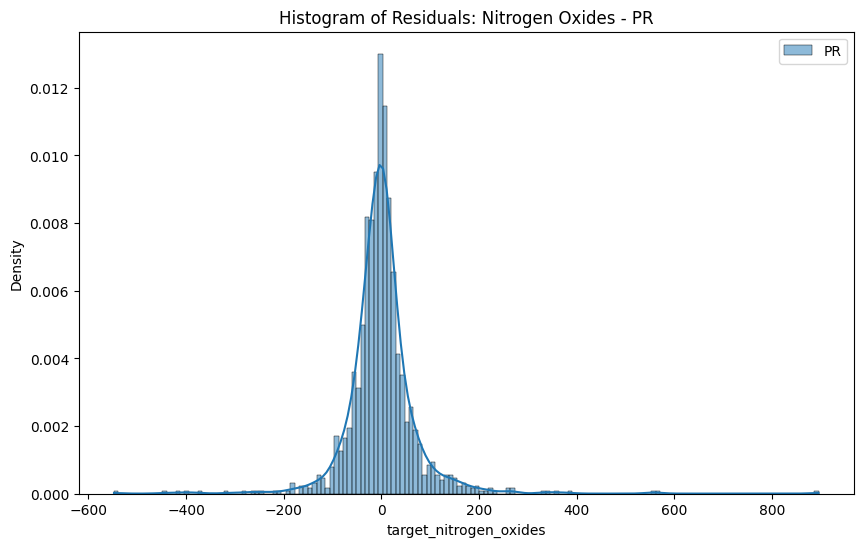

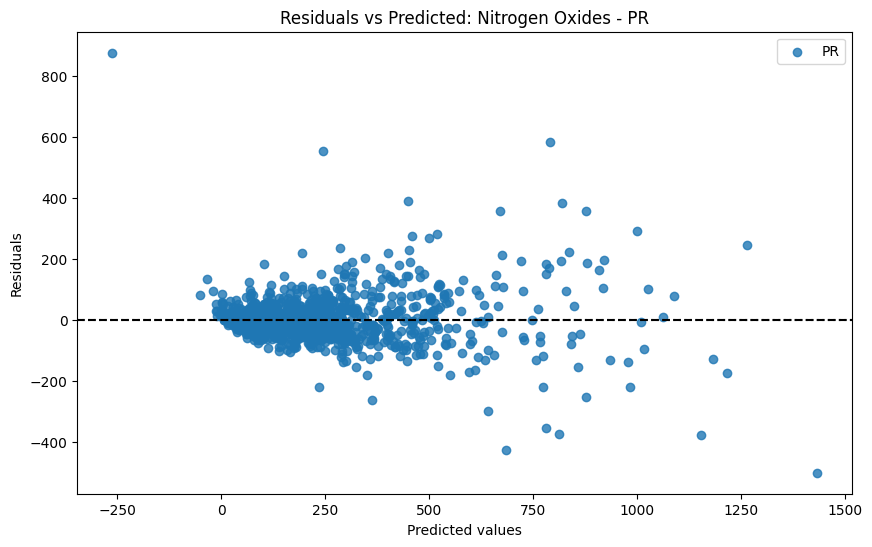

RSS for XGBR (Nitrogen Oxides): 6003349.935297573
RSS for RFR (Nitrogen Oxides): 6574084.11852636
RSS for PR (Nitrogen Oxides): 7645268.613191605


In [113]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate residuals for each model and target variable
residuals_XGBR_carbon_monoxide = y_test_target_carbon_monoxide - target_XBGR_carbon_monoxide_predictions
residuals_SVR_carbon_monoxide = y_test_target_carbon_monoxide - target_SVR_carbon_monoxide_predictions
residuals_PR_carbon_monoxide = y_test_target_carbon_monoxide - target_PR_carbon_monoxide_predictions



residuals_XGBR_benzene = y_test_target_benzene - target_XBGR_benzene_predictions
residuals_RFR_benzene = y_test_target_benzene - target_RFR_benzene_predictions
residuals_SVR_benzene = y_test_target_benzene - target_SVR_benzene_predictions


residuals_XGBR_nitrogen_oxides = y_test_target_nitrogen_oxides - target_XBGR_nitrogen_oxides_predictions
residuals_RFR_nitrogen_oxides = y_test_target_nitrogen_oxides - target_RFR_nitrogen_oxides_predictions
residuals_PR_nitrogen_oxides = y_test_target_nitrogen_oxides - target_PR_nitrogen_oxides_predictions

# Function to plot residuals
def plot_residuals(predictions, residuals, model_name, target_name):
    plt.figure(figsize=(10, 6))
    plt.scatter(predictions, residuals, alpha=0.5, label=model_name)
    plt.axhline(y=0, color='black', linestyle='--')
    plt.xlabel('Predicted values')
    plt.ylabel('Residuals')
    plt.title(f'Residual Plot: {target_name} - {model_name}')
    plt.legend()
    plt.show()

# Function to plot histograms of residuals
def plot_residual_histogram(residuals, model_name, target_name):
    plt.figure(figsize=(10, 6))
    sns.histplot(residuals, kde=True, label=model_name, stat="density")
    plt.title(f'Histogram of Residuals: {target_name} - {model_name}')
    plt.legend()
    plt.show()

# Function to plot residuals vs. predicted values
def plot_residual_vs_pred(predictions, residuals, model_name, target_name):
    plt.figure(figsize=(10, 6))
    sns.residplot(x=predictions, y=residuals, lowess=False, label=model_name)
    plt.axhline(y=0, color='black', linestyle='--')
    plt.xlabel('Predicted values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Predicted: {target_name} - {model_name}')
    plt.legend()
    plt.show()

# Function to calculate RSS
def calculate_rss(residuals):
    return np.sum(np.square(residuals))


# Plotting and calculating RSS for Carbon Monoxide
plot_residuals(target_XBGR_carbon_monoxide_predictions, residuals_XGBR_carbon_monoxide, 'XGBR', 'Carbon Monoxide')
plot_residual_histogram(residuals_XGBR_carbon_monoxide, 'XGBR', 'Carbon Monoxide')
plot_residual_vs_pred(target_XBGR_carbon_monoxide_predictions, residuals_XGBR_carbon_monoxide, 'XGBR', 'Carbon Monoxide')

plot_residuals(target_SVR_carbon_monoxide_predictions, residuals_SVR_carbon_monoxide, 'SVR', 'Carbon Monoxide')
plot_residual_histogram(residuals_SVR_carbon_monoxide, 'SVR', 'Carbon Monoxide')
plot_residual_vs_pred(target_SVR_carbon_monoxide_predictions, residuals_SVR_carbon_monoxide, 'SVR', 'Carbon Monoxide')


plot_residuals(target_PR_carbon_monoxide_predictions, residuals_PR_carbon_monoxide, 'PR', 'Carbon Monoxide')
plot_residual_histogram(residuals_PR_carbon_monoxide, 'PR', 'Carbon Monoxide')
plot_residual_vs_pred(target_PR_carbon_monoxide_predictions, residuals_PR_carbon_monoxide, 'PR', 'Carbon Monoxide')




rss_XGBR_carbon_monoxide = calculate_rss(residuals_XGBR_carbon_monoxide)
rss_SVR_carbon_monoxide = calculate_rss(residuals_SVR_carbon_monoxide)
rss_PR_carbon_monoxide = calculate_rss(residuals_PR_carbon_monoxide)



print(f'RSS for XGBR (Carbon Monoxide): {rss_XGBR_carbon_monoxide}')
print(f'RSS for SVR (Carbon Monoxide): {rss_SVR_carbon_monoxide}')
print(f'RSS for PR (Carbon Monoxide): {rss_PR_carbon_monoxide}')



# Repeat the above steps for Benzene and Nitrogen Oxides
# Benzene
plot_residuals(target_XBGR_benzene_predictions, residuals_XGBR_benzene, 'XGBR', 'Benzene')
plot_residual_histogram(residuals_XGBR_benzene, 'XGBR', 'Benzene')
plot_residual_vs_pred(target_XBGR_benzene_predictions, residuals_XGBR_benzene, 'XGBR', 'Benzene')


plot_residuals(target_RFR_benzene_predictions, residuals_RFR_benzene, 'RFR', 'Benzene')
plot_residual_histogram(residuals_RFR_benzene, 'RFR', 'Benzene')
plot_residual_vs_pred(target_RFR_benzene_predictions, residuals_RFR_benzene, 'RFR', 'Benzene')

plot_residuals(target_SVR_benzene_predictions, residuals_SVR_benzene, 'SVR', 'Benzene')
plot_residual_histogram(residuals_SVR_benzene, 'SVR', 'Benzene')
plot_residual_vs_pred(target_SVR_benzene_predictions, residuals_SVR_benzene, 'SVR', 'Benzene')



rss_XGBR_benzene = calculate_rss(residuals_XGBR_benzene)
rss_RFR_benzene = calculate_rss(residuals_RFR_benzene)
rss_SVR_benzene = calculate_rss(residuals_SVR_benzene)

print(f'RSS for XGBR (Benzene): {rss_XGBR_benzene}')
print(f'RSS for RFR (Benzene): {rss_RFR_benzene}')
print(f'RSS for SVR (Benzene): {rss_SVR_benzene}')


# Nitrogen Oxides
plot_residuals(target_XBGR_nitrogen_oxides_predictions, residuals_XGBR_nitrogen_oxides, 'XGBR', 'Nitrogen Oxides')
plot_residual_histogram(residuals_XGBR_nitrogen_oxides, 'XGBR', 'Nitrogen Oxides')
plot_residual_vs_pred(target_XBGR_nitrogen_oxides_predictions, residuals_XGBR_nitrogen_oxides, 'XGBR', 'Nitrogen Oxides')

plot_residuals(target_RFR_nitrogen_oxides_predictions, residuals_RFR_nitrogen_oxides, 'RFR', 'Nitrogen Oxides')
plot_residual_histogram(residuals_RFR_nitrogen_oxides, 'RFR', 'Nitrogen Oxides')
plot_residual_vs_pred(target_RFR_nitrogen_oxides_predictions, residuals_RFR_nitrogen_oxides, 'RFR', 'Nitrogen Oxides')

plot_residuals(target_PR_nitrogen_oxides_predictions, residuals_PR_nitrogen_oxides, 'PR', 'Nitrogen Oxides')
plot_residual_histogram(residuals_PR_nitrogen_oxides, 'PR', 'Nitrogen Oxides')
plot_residual_vs_pred(target_PR_nitrogen_oxides_predictions, residuals_PR_nitrogen_oxides, 'PR', 'Nitrogen Oxides')



rss_XGBR_nitrogen_oxides = calculate_rss(residuals_XGBR_nitrogen_oxides)
rss_RFR_nitrogen_oxides = calculate_rss(residuals_RFR_nitrogen_oxides)
rss_PR_nitrogen_oxides = calculate_rss(residuals_PR_nitrogen_oxides)

print(f'RSS for XGBR (Nitrogen Oxides): {rss_XGBR_nitrogen_oxides}')
print(f'RSS for RFR (Nitrogen Oxides): {rss_RFR_nitrogen_oxides}')
print(f'RSS for PR (Nitrogen Oxides): {rss_PR_nitrogen_oxides}')



In [114]:
from sklearn.linear_model import LinearRegression

#prediction of carbon
target_XBGR_carbon_monoxide_predictions = best_XGBR_model_target_carbon_monoxide.predict(X_test_target_carbon_monoxide)
target_SVR_carbon_monoxide_predictions = best_SVR_model_target_carbon_monoxide.predict(X_test_target_carbon_monoxide)
target_PR_carbon_monoxide_predictions = best_PR_model_target_carbon_monoxide.predict(X_test_target_carbon_monoxide)

#prediction of banzene
target_XBGR_benzene_predictions = best_XGBR_model_target_benzene.predict(X_test_target_benzene)
target_RFR_benzene_predictions = best_RFR_model_target_benzene.predict(X_test_target_benzene)
target_SVR_benzene_predictions = best_SVR_model_target_benzene.predict(X_test_target_benzene)


#prediction of nitrogen
target_XBGR_nitrogen_oxides_predictions = best_XGBR_model_target_nitrogen_oxides.predict(X_test_target_nitrogen_oxides)
target_RFR_nitrogen_oxides_predictions = best_RFR_model_target_nitrogen_oxides.predict(X_test_target_nitrogen_oxides)
target_PR_nitrogen_oxides_predictions = best_PR_model_target_nitrogen_oxides.predict(X_test_target_nitrogen_oxides)

# stacking the predictions of all the models

stacked_predictions_carbon = np.column_stack((target_XBGR_carbon_monoxide_predictions, target_SVR_carbon_monoxide_predictions, target_PR_carbon_monoxide_predictions))
stacked_predictions_benzene = np.column_stack((target_XBGR_benzene_predictions, target_RFR_benzene_predictions, target_SVR_benzene_predictions))
stacked_predictions_nitrogen = np.column_stack((target_XBGR_nitrogen_oxides_predictions, target_RFR_nitrogen_oxides_predictions, target_PR_nitrogen_oxides_predictions))

# split the data into training and testing data
X_stacked_predictions_carbon_train, X_stacked_predictions_carbon_test, y_stacked_predictions_carbon_train, y_stacked_predictions_carbon_test = train_test_split(stacked_predictions_carbon, y_test_target_carbon_monoxide, test_size=0.2, random_state=42)

X_stacked_predictions_benzene_train, X_stacked_predictions_benzene_test, y_stacked_predictions_benzene_train, y_stacked_predictions_benzene_test = train_test_split(stacked_predictions_benzene, y_test_target_benzene, test_size=0.2, random_state=42)

X_stacked_predictions_nitrogen_train, X_stacked_predictions_nitrogen_test, y_stacked_predictions_nitrogen_train, y_stacked_predictions_nitrogen_test = train_test_split(stacked_predictions_nitrogen, y_test_target_nitrogen_oxides, test_size=0.2, random_state=42)



# fitting the stacked predictions to a linear regression model
stacked_model_carbon = LinearRegression()
stacked_model_benzene = LinearRegression()
stacked_model_nitrogen = LinearRegression()

stacked_model_carbon.fit(X_stacked_predictions_carbon_train, y_stacked_predictions_carbon_train)
stacked_model_benzene.fit(X_stacked_predictions_benzene_train, y_stacked_predictions_benzene_train)
stacked_model_nitrogen.fit(X_stacked_predictions_nitrogen_train, y_stacked_predictions_nitrogen_train)

# get the predictions for the stacked test data using the stacked model

predictions_stacked_model_carbon = stacked_model_carbon.predict(X_stacked_predictions_carbon_test)
predictions_stacked_model_benzene = stacked_model_benzene.predict(X_stacked_predictions_benzene_test)
predictions_stacked_model_nitrogen = stacked_model_nitrogen.predict(X_stacked_predictions_nitrogen_test)

# get the mean squared error and r2
mean_squared_error_stacked_model_carbon = mean_squared_error(y_stacked_predictions_carbon_test, predictions_stacked_model_carbon)
r2_score_stacked_model_carbon = r2_score(y_stacked_predictions_carbon_test, predictions_stacked_model_carbon)

mean_squared_error_stacked_model_benzene = mean_squared_error(y_stacked_predictions_benzene_test, predictions_stacked_model_benzene)
r2_score_stacked_model_benzene = r2_score(y_stacked_predictions_benzene_test, predictions_stacked_model_benzene)

mean_squared_error_stacked_model_nitrogen = mean_squared_error(y_stacked_predictions_nitrogen_test, predictions_stacked_model_nitrogen)
r2_score_stacked_model_nitrogen = r2_score(y_stacked_predictions_nitrogen_test, predictions_stacked_model_nitrogen)


print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_stacked_model_carbon}')
print(f'R2 Score for target_carbon_monoxide: {r2_score_stacked_model_carbon}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_stacked_model_benzene}')
print(f'R2 Score for target_benzene: {r2_score_stacked_model_benzene}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_stacked_model_nitrogen}')
print(f'R2 Score for target_nitrogen_oxides: {r2_score_stacked_model_nitrogen}')

# get combined r2 score for all the target variables	

r2_score_combined_stacked_model =  (r2_score_stacked_model_carbon + r2_score_stacked_model_benzene + r2_score_stacked_model_nitrogen) / 3

print(f'Combined R2 Score: {r2_score_combined_stacked_model}')







Mean Squared Error for target_carbon_monoxide: 0.1454148527682675
R2 Score for target_carbon_monoxide: 0.9380586933571708
Mean Squared Error for target_benzene: 1.5607456471547003
R2 Score for target_benzene: 0.9771410926573295
Mean Squared Error for target_nitrogen_oxides: 3109.248804781233
R2 Score for target_nitrogen_oxides: 0.9070135207741866
Combined R2 Score: 0.9407377689295623


In [25]:
#adjusted R2 score for the stacked model

def adjusted_r2_score(r2_score, n, p):
    return 1 - (1 - r2_score) * (n - 1) / (n - p - 1)

cn = 284
bn = 284
nn = 284

cp = 6
bp = 10
nop = 7

adjusted_r2_score_carbon = adjusted_r2_score(0.9380586933571708, cn, cp)
adjusted_r2_score_benzene = adjusted_r2_score(0.9771410926573295, bn, bp)
adjusted_r2_score_nitrogen = adjusted_r2_score(0.9070135207741866, nn, nop)

print(f'Adjusted R2 Score for target_carbon_monoxide: {adjusted_r2_score_carbon}')
print(f'Adjusted R2 Score for target_benzene: {adjusted_r2_score_benzene}')
print(f'Adjusted R2 Score for target_nitrogen_oxides: {adjusted_r2_score_nitrogen}')

# get combined adjusted r2 score for all the target variables	

adjusted_r2_score_combined_stacked_model =  (adjusted_r2_score_carbon + adjusted_r2_score_benzene + adjusted_r2_score_nitrogen) / 3

print(f'Combined Adjusted R2 Score: {adjusted_r2_score_combined_stacked_model}')



Adjusted R2 Score for target_carbon_monoxide: 0.9367170044046186
Adjusted R2 Score for target_benzene: 0.9763037700440449
Adjusted R2 Score for target_nitrogen_oxides: 0.9046551680401986
Combined Adjusted R2 Score: 0.939225314162954


In [115]:
# xgbregressor without using random search

XGBRegressor_model_carbon = XGBRegressor(n_estimators=1000, max_depth=7, learning_rate=0.3, subsample=0.7, colsample_bytree=0.7, gamma=0.1, objective='reg:squarederror')

XGBRegressor_model_benzene = XGBRegressor(n_estimators=1000, max_depth=7, learning_rate=0.3, subsample=0.7, colsample_bytree=0.7, gamma=0.1, objective='reg:squarederror')

XGBRegressor_model_nitrogen = XGBRegressor(n_estimators=1000, max_depth=7, learning_rate=0.3, subsample=0.7, colsample_bytree=0.7, gamma=0.1, objective='reg:squarederror')

XGBRegressor_model_carbon.fit(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

XGBRegressor_model_benzene.fit(X_train_target_benzene, y_train_target_benzene)

XGBRegressor_model_nitrogen.fit(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)

XGBRegressor_model_carbon_predictions = XGBRegressor_model_carbon.predict(X_test_target_carbon_monoxide)

XGBRegressor_model_benzene_predictions = XGBRegressor_model_benzene.predict(X_test_target_benzene)

XGBRegressor_model_nitrogen_predictions = XGBRegressor_model_nitrogen.predict(X_test_target_nitrogen_oxides)

mean_squared_error_target_carbon_monoxide_XGBR = mean_squared_error(y_test_target_carbon_monoxide, XGBRegressor_model_carbon_predictions)

r2_score_target_carbon_monoxide_XGBR = r2_score(y_test_target_carbon_monoxide, XGBRegressor_model_carbon_predictions)

mean_squared_error_target_benzene_XGBR = mean_squared_error(y_test_target_benzene, XGBRegressor_model_benzene_predictions)

r2_score_target_benzene_XGBR = r2_score(y_test_target_benzene, XGBRegressor_model_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_XGBR = mean_squared_error(y_test_target_nitrogen_oxides, XGBRegressor_model_nitrogen_predictions)

r2_score_target_nitrogen_oxides_XGBR = r2_score(y_test_target_nitrogen_oxides, XGBRegressor_model_nitrogen_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_XGBR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_XGBR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_XGBR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_XGBR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_XGBR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_XGBR}')

# get combined r2 score for all the target variables	

r2_score_combined_XGBR =  (r2_score_target_carbon_monoxide_XGBR + r2_score_target_benzene_XGBR + r2_score_target_nitrogen_oxides_XGBR) / 3

print(f'Combined R2 Score: {r2_score_combined_XGBR}')



Mean Squared Error for target_carbon_monoxide: 0.24233397006915156
R2 Score for target_carbon_monoxide: 0.8953365081457495
Mean Squared Error for target_benzene: 1.9087577785176573
R2 Score for target_benzene: 0.9708481753380442
Mean Squared Error for target_nitrogen_oxides: 5941.402740308519
R2 Score for target_nitrogen_oxides: 0.8480128240327695
Combined R2 Score: 0.904732502505521


In [116]:
# random forest regressor without using random search

from sklearn.ensemble import RandomForestRegressor

RandomForestRegressor_model_carbon = RandomForestRegressor(n_estimators=1000, max_depth=7, min_samples_split=2, min_samples_leaf=1, bootstrap=True)

RandomForestRegressor_model_benzene = RandomForestRegressor(n_estimators=1000, max_depth=7, min_samples_split=2, min_samples_leaf=1, bootstrap=True)

RandomForestRegressor_model_nitrogen = RandomForestRegressor(n_estimators=1000, max_depth=7, min_samples_split=2, min_samples_leaf=1, bootstrap=True)

RandomForestRegressor_model_carbon.fit(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

RandomForestRegressor_model_benzene.fit(X_train_target_benzene, y_train_target_benzene)

RandomForestRegressor_model_nitrogen.fit(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)

RandomForestRegressor_model_carbon_predictions = RandomForestRegressor_model_carbon.predict(X_test_target_carbon_monoxide)

RandomForestRegressor_model_benzene_predictions = RandomForestRegressor_model_benzene.predict(X_test_target_benzene)

RandomForestRegressor_model_nitrogen_predictions = RandomForestRegressor_model_nitrogen.predict(X_test_target_nitrogen_oxides)

mean_squared_error_target_carbon_monoxide_RFR = mean_squared_error(y_test_target_carbon_monoxide, RandomForestRegressor_model_carbon_predictions)

r2_score_target_carbon_monoxide_RFR = r2_score(y_test_target_carbon_monoxide, RandomForestRegressor_model_carbon_predictions)

mean_squared_error_target_benzene_RFR = mean_squared_error(y_test_target_benzene, RandomForestRegressor_model_benzene_predictions)

r2_score_target_benzene_RFR = r2_score(y_test_target_benzene, RandomForestRegressor_model_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_RFR = mean_squared_error(y_test_target_nitrogen_oxides, RandomForestRegressor_model_nitrogen_predictions)

r2_score_target_nitrogen_oxides_RFR = r2_score(y_test_target_nitrogen_oxides, RandomForestRegressor_model_nitrogen_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_RFR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_RFR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_RFR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_RFR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_RFR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_RFR}')

# get combined r2 score for all the target variables	

r2_score_combined_RFR =  (r2_score_target_carbon_monoxide_RFR + r2_score_target_benzene_RFR + r2_score_target_nitrogen_oxides_RFR) / 3

print(f'Combined R2 Score: {r2_score_combined_RFR}')



Mean Squared Error for target_carbon_monoxide: 0.22612975426351203
R2 Score for target_carbon_monoxide: 0.9023350721873244
Mean Squared Error for target_benzene: 1.7296100347566057
R2 Score for target_benzene: 0.9735842394282521
Mean Squared Error for target_nitrogen_oxides: 4636.0780048052475
R2 Score for target_nitrogen_oxides: 0.8814043695887289
Combined R2 Score: 0.9191078937347684


In [117]:
# decision tree regressor without using random search

from sklearn.tree import DecisionTreeRegressor

DecisionTreeRegressor_model_carbon = DecisionTreeRegressor(max_depth=6, min_samples_split=2, min_samples_leaf=1)

DecisionTreeRegressor_model_benzene = DecisionTreeRegressor(max_depth=6, min_samples_split=2, min_samples_leaf=1)

DecisionTreeRegressor_model_nitrogen = DecisionTreeRegressor(max_depth=6, min_samples_split=2, min_samples_leaf=1)

DecisionTreeRegressor_model_carbon.fit(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

DecisionTreeRegressor_model_benzene.fit(X_train_target_benzene, y_train_target_benzene)

DecisionTreeRegressor_model_nitrogen.fit(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)

DecisionTreeRegressor_model_carbon_predictions = DecisionTreeRegressor_model_carbon.predict(X_test_target_carbon_monoxide)

DecisionTreeRegressor_model_benzene_predictions = DecisionTreeRegressor_model_benzene.predict(X_test_target_benzene)

DecisionTreeRegressor_model_nitrogen_predictions = DecisionTreeRegressor_model_nitrogen.predict(X_test_target_nitrogen_oxides)

mean_squared_error_target_carbon_monoxide_DTR = mean_squared_error(y_test_target_carbon_monoxide, DecisionTreeRegressor_model_carbon_predictions)

r2_score_target_carbon_monoxide_DTR = r2_score(y_test_target_carbon_monoxide, DecisionTreeRegressor_model_carbon_predictions)

mean_squared_error_target_benzene_DTR = mean_squared_error(y_test_target_benzene, DecisionTreeRegressor_model_benzene_predictions)

r2_score_target_benzene_DTR = r2_score(y_test_target_benzene, DecisionTreeRegressor_model_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_DTR = mean_squared_error(y_test_target_nitrogen_oxides, DecisionTreeRegressor_model_nitrogen_predictions)

r2_score_target_nitrogen_oxides_DTR = r2_score(y_test_target_nitrogen_oxides, DecisionTreeRegressor_model_nitrogen_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_DTR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_DTR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_DTR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_DTR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_DTR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_DTR}')

# get combined r2 score for all the target variables	

r2_score_combined_DTR =  (r2_score_target_carbon_monoxide_DTR + r2_score_target_benzene_DTR + r2_score_target_nitrogen_oxides_DTR) / 3

print(f'Combined R2 Score: {r2_score_combined_DTR}')



Mean Squared Error for target_carbon_monoxide: 0.2852986969678035
R2 Score for target_carbon_monoxide: 0.8767801400785984
Mean Squared Error for target_benzene: 2.129849346448705
R2 Score for target_benzene: 0.9674715171286573
Mean Squared Error for target_nitrogen_oxides: 6887.301256381548
R2 Score for target_nitrogen_oxides: 0.8238157698195975
Combined R2 Score: 0.8893558090089511


In [118]:
# KNeighborsRegressor without using random search 

from sklearn.neighbors import KNeighborsRegressor

KNeighborsRegressor_model_carbon = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='auto')

KNeighborsRegressor_model_benzene = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='auto')

KNeighborsRegressor_model_nitrogen = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='auto')

KNeighborsRegressor_model_carbon.fit(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

KNeighborsRegressor_model_benzene.fit(X_train_target_benzene, y_train_target_benzene)

KNeighborsRegressor_model_nitrogen.fit(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)

KNeighborsRegressor_model_carbon_predictions = KNeighborsRegressor_model_carbon.predict(X_test_target_carbon_monoxide)

KNeighborsRegressor_model_benzene_predictions = KNeighborsRegressor_model_benzene.predict(X_test_target_benzene)

KNeighborsRegressor_model_nitrogen_predictions = KNeighborsRegressor_model_nitrogen.predict(X_test_target_nitrogen_oxides)

mean_squared_error_target_carbon_monoxide_KNR = mean_squared_error(y_test_target_carbon_monoxide, KNeighborsRegressor_model_carbon_predictions)

r2_score_target_carbon_monoxide_KNR = r2_score(y_test_target_carbon_monoxide, KNeighborsRegressor_model_carbon_predictions)

mean_squared_error_target_benzene_KNR = mean_squared_error(y_test_target_benzene, KNeighborsRegressor_model_benzene_predictions)

r2_score_target_benzene_KNR = r2_score(y_test_target_benzene, KNeighborsRegressor_model_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_KNR = mean_squared_error(y_test_target_nitrogen_oxides, KNeighborsRegressor_model_nitrogen_predictions)

r2_score_target_nitrogen_oxides_KNR = r2_score(y_test_target_nitrogen_oxides, KNeighborsRegressor_model_nitrogen_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_KNR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_KNR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_KNR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_KNR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_KNR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_KNR}')

# get combined r2 score for all the target variables	

r2_score_combined_KNR =  (r2_score_target_carbon_monoxide_KNR + r2_score_target_benzene_KNR + r2_score_target_nitrogen_oxides_KNR) / 3

print(f'Combined R2 Score: {r2_score_combined_KNR}')

    

Mean Squared Error for target_carbon_monoxide: 0.2847688372648944
R2 Score for target_carbon_monoxide: 0.8770089852821144
Mean Squared Error for target_benzene: 2.3511240896327177
R2 Score for target_benzene: 0.9640920613443675
Mean Squared Error for target_nitrogen_oxides: 8763.40610680459
R2 Score for target_nitrogen_oxides: 0.7758230834966005
Combined R2 Score: 0.8723080433743607


In [119]:
# 
# polynomial regression without using random search

from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression

PolynomialRegression_model_carbon = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())

PolynomialRegression_model_benzene = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())

PolynomialRegression_model_nitrogen = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())

PolynomialRegression_model_carbon.fit(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

PolynomialRegression_model_benzene.fit(X_train_target_benzene, y_train_target_benzene)

PolynomialRegression_model_nitrogen.fit(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)

PolynomialRegression_model_carbon_predictions = PolynomialRegression_model_carbon.predict(X_test_target_carbon_monoxide)

PolynomialRegression_model_benzene_predictions = PolynomialRegression_model_benzene.predict(X_test_target_benzene)

PolynomialRegression_model_nitrogen_predictions = PolynomialRegression_model_nitrogen.predict(X_test_target_nitrogen_oxides)

mean_squared_error_target_carbon_monoxide_PR = mean_squared_error(y_test_target_carbon_monoxide, PolynomialRegression_model_carbon_predictions)

r2_score_target_carbon_monoxide_PR = r2_score(y_test_target_carbon_monoxide, PolynomialRegression_model_carbon_predictions)

mean_squared_error_target_benzene_PR = mean_squared_error(y_test_target_benzene, PolynomialRegression_model_benzene_predictions)

r2_score_target_benzene_PR = r2_score(y_test_target_benzene, PolynomialRegression_model_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_PR = mean_squared_error(y_test_target_nitrogen_oxides, PolynomialRegression_model_nitrogen_predictions)

r2_score_target_nitrogen_oxides_PR = r2_score(y_test_target_nitrogen_oxides, PolynomialRegression_model_nitrogen_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_PR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_PR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_PR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_PR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_PR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_PR}')

# get combined r2 score for all the target variables	

r2_score_combined_PR =  (r2_score_target_carbon_monoxide_PR + r2_score_target_benzene_PR + r2_score_target_nitrogen_oxides_PR) / 3

print(f'Combined R2 Score: {r2_score_combined_PR}')



Mean Squared Error for target_carbon_monoxide: 0.2654496215648545
R2 Score for target_carbon_monoxide: 0.8853529107106238
Mean Squared Error for target_benzene: 1.5469392130184767
R2 Score for target_benzene: 0.9763741103202523
Mean Squared Error for target_nitrogen_oxides: 6190.279694981137
R2 Score for target_nitrogen_oxides: 0.8416462962686456
Combined R2 Score: 0.9011244390998406


In [120]:
# multiple linear regression without using random search

from sklearn.linear_model import LinearRegression

MultipleLinearRegression_model_carbon = LinearRegression(fit_intercept=True)

MultipleLinearRegression_model_benzene = LinearRegression(fit_intercept=True)

MultipleLinearRegression_model_nitrogen = LinearRegression(fit_intercept=True)

MultipleLinearRegression_model_carbon.fit(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

MultipleLinearRegression_model_benzene.fit(X_train_target_benzene, y_train_target_benzene)

MultipleLinearRegression_model_nitrogen.fit(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)

MultipleLinearRegression_model_carbon_predictions = MultipleLinearRegression_model_carbon.predict(X_test_target_carbon_monoxide)

MultipleLinearRegression_model_benzene_predictions = MultipleLinearRegression_model_benzene.predict(X_test_target_benzene)

MultipleLinearRegression_model_nitrogen_predictions = MultipleLinearRegression_model_nitrogen.predict(X_test_target_nitrogen_oxides)

mean_squared_error_target_carbon_monoxide_MLR = mean_squared_error(y_test_target_carbon_monoxide, MultipleLinearRegression_model_carbon_predictions)

r2_score_target_carbon_monoxide_MLR = r2_score(y_test_target_carbon_monoxide, MultipleLinearRegression_model_carbon_predictions)

mean_squared_error_target_benzene_MLR = mean_squared_error(y_test_target_benzene, MultipleLinearRegression_model_benzene_predictions)

r2_score_target_benzene_MLR = r2_score(y_test_target_benzene, MultipleLinearRegression_model_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_MLR = mean_squared_error(y_test_target_nitrogen_oxides, MultipleLinearRegression_model_nitrogen_predictions)

r2_score_target_nitrogen_oxides_MLR = r2_score(y_test_target_nitrogen_oxides, MultipleLinearRegression_model_nitrogen_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_MLR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_MLR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_MLR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_MLR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_MLR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_MLR}')

# get combined r2 score for all the target variables	

r2_score_combined_MLR =  (r2_score_target_carbon_monoxide_MLR + r2_score_target_benzene_MLR + r2_score_target_nitrogen_oxides_MLR) / 3

print(f'Combined R2 Score: {r2_score_combined_MLR}')



Mean Squared Error for target_carbon_monoxide: 0.3824257363498317
R2 Score for target_carbon_monoxide: 0.8348311921358582
Mean Squared Error for target_benzene: 3.368287878443101
R2 Score for target_benzene: 0.948557256060211
Mean Squared Error for target_nitrogen_oxides: 10025.168263538244
R2 Score for target_nitrogen_oxides: 0.743545913386043
Combined R2 Score: 0.842311453860704


In [121]:
# elastic net regression without using random search

from sklearn.linear_model import ElasticNet

ElasticNet_model_carbon = ElasticNet(alpha=0.1, l1_ratio=0.1, fit_intercept=True)

ElasticNet_model_benzene = ElasticNet(alpha=0.1, l1_ratio=0.1, fit_intercept=True)

ElasticNet_model_nitrogen = ElasticNet(alpha=0.1, l1_ratio=0.1, fit_intercept=True)

ElasticNet_model_carbon.fit(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)

ElasticNet_model_benzene.fit(X_train_target_benzene, y_train_target_benzene)

ElasticNet_model_nitrogen.fit(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)

ElasticNet_model_carbon_predictions = ElasticNet_model_carbon.predict(X_test_target_carbon_monoxide)

ElasticNet_model_benzene_predictions = ElasticNet_model_benzene.predict(X_test_target_benzene)

ElasticNet_model_nitrogen_predictions = ElasticNet_model_nitrogen.predict(X_test_target_nitrogen_oxides)

mean_squared_error_target_carbon_monoxide_ENR = mean_squared_error(y_test_target_carbon_monoxide, ElasticNet_model_carbon_predictions)

r2_score_target_carbon_monoxide_ENR = r2_score(y_test_target_carbon_monoxide, ElasticNet_model_carbon_predictions)

mean_squared_error_target_benzene_ENR = mean_squared_error(y_test_target_benzene, ElasticNet_model_benzene_predictions)

r2_score_target_benzene_ENR = r2_score(y_test_target_benzene, ElasticNet_model_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_ENR = mean_squared_error(y_test_target_nitrogen_oxides, ElasticNet_model_nitrogen_predictions)

r2_score_target_nitrogen_oxides_ENR = r2_score(y_test_target_nitrogen_oxides, ElasticNet_model_nitrogen_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_ENR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_ENR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_ENR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_ENR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_ENR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_ENR}')

# get combined r2 score for all the target variables	

r2_score_combined_ENR =  (r2_score_target_carbon_monoxide_ENR + r2_score_target_benzene_ENR + r2_score_target_nitrogen_oxides_ENR) / 3

print(f'Combined R2 Score: {r2_score_combined_ENR}')



Mean Squared Error for target_carbon_monoxide: 0.3824775811006333
R2 Score for target_carbon_monoxide: 0.8348088005056149
Mean Squared Error for target_benzene: 3.3739045528837854
R2 Score for target_benzene: 0.9484714744538066
Mean Squared Error for target_nitrogen_oxides: 10032.336670823131
R2 Score for target_nitrogen_oxides: 0.7433625381753337
Combined R2 Score: 0.8422142710449183


In [122]:
# svm without using random search

from sklearn.svm import SVR

SVR_model_carbon = SVR(C=100, epsilon=0.1, kernel='rbf')

SVR_model_benzene = SVR(C=100, epsilon=0.1, kernel='rbf')
SVR_model_nitrogen = SVR(C=100, epsilon=0.1, kernel='rbf')

SVR_model_carbon.fit(X_train_target_carbon_monoxide, y_train_target_carbon_monoxide)
print('done')

SVR_model_benzene.fit(X_train_target_benzene, y_train_target_benzene)
print('done')

SVR_model_nitrogen.fit(X_train_target_nitrogen_oxides, y_train_target_nitrogen_oxides)
print('done')

SVR_model_carbon_predictions = SVR_model_carbon.predict(X_test_target_carbon_monoxide)

SVR_model_benzene_predictions = SVR_model_benzene.predict(X_test_target_benzene)

SVR_model_nitrogen_predictions = SVR_model_nitrogen.predict(X_test_target_nitrogen_oxides)

mean_squared_error_target_carbon_monoxide_SVR = mean_squared_error(y_test_target_carbon_monoxide, SVR_model_carbon_predictions)

r2_score_target_carbon_monoxide_SVR = r2_score(y_test_target_carbon_monoxide, SVR_model_carbon_predictions)

mean_squared_error_target_benzene_SVR = mean_squared_error(y_test_target_benzene, SVR_model_benzene_predictions)

r2_score_target_benzene_SVR = r2_score(y_test_target_benzene, SVR_model_benzene_predictions)

mean_squared_error_target_nitrogen_oxides_SVR = mean_squared_error(y_test_target_nitrogen_oxides, SVR_model_nitrogen_predictions)

r2_score_target_nitrogen_oxides_SVR = r2_score(y_test_target_nitrogen_oxides, SVR_model_nitrogen_predictions)

print(f'Mean Squared Error for target_carbon_monoxide: {mean_squared_error_target_carbon_monoxide_SVR}')

print(f'R2 Score for target_carbon_monoxide: {r2_score_target_carbon_monoxide_SVR}')

print(f'Mean Squared Error for target_benzene: {mean_squared_error_target_benzene_SVR}')

print(f'R2 Score for target_benzene: {r2_score_target_benzene_SVR}')

print(f'Mean Squared Error for target_nitrogen_oxides: {mean_squared_error_target_nitrogen_oxides_SVR}')

print(f'R2 Score for target_nitrogen_oxides: {r2_score_target_nitrogen_oxides_SVR}')

# get combined r2 score for all the target variables	

r2_score_combined_SVR =  (r2_score_target_carbon_monoxide_SVR + r2_score_target_benzene_SVR + r2_score_target_nitrogen_oxides_SVR) / 3

print(f'Combined R2 Score: {r2_score_combined_SVR}')



done
done
done
Mean Squared Error for target_carbon_monoxide: 0.26922339862315114
R2 Score for target_carbon_monoxide: 0.883723024961267
Mean Squared Error for target_benzene: 1.4622077034749439
R2 Score for target_benzene: 0.9776681865709719
Mean Squared Error for target_nitrogen_oxides: 10871.699654176218
R2 Score for target_nitrogen_oxides: 0.7218907721585697
Combined R2 Score: 0.8610939945636028


In [123]:
# print all the r2 score for all the models without using random search

print(f'Combined R2 Score for XGBRegressor: {r2_score_combined_XGBR}')

print(f'Combined R2 Score for SVR: {r2_score_combined_SVR}')

print(f'Combined R2 Score for RandomForestRegressor: {r2_score_combined_RFR}')

print(f'Combined R2 Score for DecisionTreeRegressor: {r2_score_combined_DTR}')

print(f'Combined R2 Score for KNeighborsRegressor: {r2_score_combined_KNR}')

print(f'Combined R2 Score for Polynomial Regression: {r2_score_combined_PR}')

print(f'Combined R2 Score for Multiple Linear Regression: {r2_score_combined_MLR}')

print(f'Combined R2 Score for Elastic Net Regression: {r2_score_combined_ENR}')



Combined R2 Score for XGBRegressor: 0.904732502505521
Combined R2 Score for SVR: 0.8610939945636028
Combined R2 Score for RandomForestRegressor: 0.9191078937347684
Combined R2 Score for DecisionTreeRegressor: 0.8893558090089511
Combined R2 Score for KNeighborsRegressor: 0.8723080433743607
Combined R2 Score for Polynomial Regression: 0.9011244390998406
Combined R2 Score for Multiple Linear Regression: 0.842311453860704
Combined R2 Score for Elastic Net Regression: 0.8422142710449183
